// Result for BODY_25 (25 body parts consisting of COCO + foot)
// const std::map<unsigned int, std::string> POSE_BODY_25_BODY_PARTS {
//     {0,  "Nose"},
//     {1,  "Neck"},
//     {2,  "RShoulder"},
//     {3,  "RElbow"},
//     {4,  "RWrist"},
//     {5,  "LShoulder"},
//     {6,  "LElbow"},
//     {7,  "LWrist"},
//     {8,  "MidHip"},
//     {9,  "RHip"},
//     {10, "RKnee"},
//     {11, "RAnkle"},
//     {12, "LHip"},
//     {13, "LKnee"},
//     {14, "LAnkle"},
//     {15, "REye"},
//     {16, "LEye"},
//     {17, "REar"},
//     {18, "LEar"},
//     {19, "LBigToe"},
//     {20, "LSmallToe"},
//     {21, "LHeel"},
//     {22, "RBigToe"},
//     {23, "RSmallToe"},
//     {24, "RHeel"},
//     {25, "Background"}

** x-coord is horizontal axis

In [115]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json
import re

%matplotlib inline
# sns.set_context('paper', font_scale=1.5)

import os, glob
from pathlib import Path
from scipy import stats, interpolate, signal
from scipy.signal import welch, butter, filtfilt
from HelperFcns import *

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
#for interactive plots
%matplotlib notebook

In [3]:
datapath = Path('C:/openpose/output/')

In [4]:
os.listdir(datapath)

['1004',
 '1009',
 '1019',
 '1023',
 '1039',
 '1043',
 '1043_Body25B_2',
 '1043_OPTrain',
 '1044',
 '1049',
 '1050',
 '1052',
 '1054',
 '1056']

In [33]:
datapath = Path('C:/openpose/output/')
for subj in os.listdir(datapath): #loop through subjects
    filepath = datapath / subj
    posefiles = os.listdir(filepath)
    tasks = [p.split('_')[0] for p in posefiles]; cycles = [c.split('_')[1] for c in posefiles]

In [53]:
task_to_process = ['Sitng']
tc = pd.DataFrame({'Task':tasks, 'Cycle':cycles, 'file':posefiles})
tc = tc.loc[tc.Task.isin(task_to_process)]
tc.reset_index(drop=True, inplace=True)

In [56]:
tc.head()

,Task,Cycle,file
0,Sitng,1,Sitng_1_000000000000_keypoints.json
1,Sitng,1,Sitng_1_000000000001_keypoints.json
2,Sitng,1,Sitng_1_000000000002_keypoints.json
3,Sitng,1,Sitng_1_000000000003_keypoints.json
4,Sitng,1,Sitng_1_000000000004_keypoints.json


In [77]:
posefile = 'poses.csv'
df = saveposes_s(Path('C:/openpose/output/'), posefile=posefile, tasks_to_process=['Sitng'], outfile='PosesNew.csv')

1009 Sitng 1
C:\openpose\output\1009\Sitng_1_000000000000_keypoints.json
1009 Sitng 3
C:\openpose\output\1009\Sitng_3_000000000000_keypoints.json
1019 Sitng 2
C:\openpose\output\1019\Sitng_2_000000000000_keypoints.json
1019 Sitng 3
C:\openpose\output\1019\Sitng_3_000000000000_keypoints.json
1049 Sitng 1
C:\openpose\output\1049\Sitng_1_000000000000_keypoints.json
1049 Sitng 3
C:\openpose\output\1049\Sitng_3_000000000000_keypoints.json
1050 Sitng 1
C:\openpose\output\1050\Sitng_1_000000000000_keypoints.json
1050 Sitng 3
C:\openpose\output\1050\Sitng_3_000000000000_keypoints.json
1052 Sitng 2
C:\openpose\output\1052\Sitng_2_000000000000_keypoints.json
1056 Sitng 1
C:\openpose\output\1056\Sitng_1_000000000000_keypoints.json
1056 Sitng 2
C:\openpose\output\1056\Sitng_2_000000000000_keypoints.json
No pose data found in frame 95
No pose data found in frame 96
No pose data found in frame 145
No pose data found in frame 227
No pose data found in frame 246
No pose data found in frame 288
No pose

In [ ]:
df = saveposes()

## Load pose files and create dataframe

In [71]:
posefile = 'posesNew.csv'
df= pd.read_csv(Path('../Metadata/'+posefile))

In [72]:
df.head()

,Unnamed: 0,SubjID,Task,cycle,elbR_x,elbR_y,elbR_c,wriR_x,wriR_y,wriR_c,...,midL_x,midL_y,midL_c,ringL_x,ringL_y,ringL_c,pinkyL_x,pinkyL_y,pinkyL_c,Npeople
0,0,1004,FtnL,1,329.352,329.357,0.899764,360.768,385.545,0.824514,...,543.452,254.301,0.061957,540.300,256.777,0.078977,539.850,256.777,0.089969,3
1,1,1004,FtnL,1,329.346,328.036,0.889666,360.735,381.679,0.862279,...,539.815,254.932,0.129784,539.146,254.932,0.119539,532.907,253.149,0.160184,3
2,2,1004,FtnL,1,329.380,324.163,0.856091,360.758,380.347,0.878291,...,540.327,252.768,0.159085,539.872,255.268,0.124295,532.826,250.950,0.132498,3
3,3,1004,FtnL,1,329.406,318.941,0.898018,360.764,376.411,0.820703,...,539.706,247.097,0.259074,539.035,246.874,0.156923,537.918,246.427,0.176433,3
4,4,1004,FtnL,1,329.426,313.724,0.841354,360.779,371.164,0.881449,...,532.671,245.415,0.126552,531.071,245.872,0.097432,530.843,245.415,0.095396,3


In [76]:
df[df.Task=='Sitng'].SubjID.unique()

array([1052, 1009], dtype=int64)

### Single subject processing

In [240]:
datapath = Path('C:/openpose/output/') 
subjfolders = os.listdir(datapath)[-1]

In [241]:
posefiles = os.listdir(datapath / subjfolders)
posefiles[:4]

['TestVideo1_000000000000_keypoints.json',
 'TestVideo1_000000000001_keypoints.json',
 'TestVideo1_000000000002_keypoints.json',
 'TestVideo1_000000000003_keypoints.json']

In [242]:
datapath / subjfolders / posefiles[0]

WindowsPath('C:/openpose/output/9999/TestVideo1_000000000000_keypoints.json')

In [243]:
Path(file).as_posix()

'TestVideo1_000000000417_keypoints.json'

In [244]:
subj = '9999'
task = 'RamR'
cycle = 1
for file in posefiles:
    with open(datapath / subjfolders / file) as f:
        try:
            data = json.load(f)
        except(UnicodeDecodeError):
            print('cannot parse ',str(file))

    person = 0 #for now use first person detected (need to be updated)

    #frame nr from filename
    str1 = Path(file).as_posix()
    match = re.search(r'\d+_keypoints',str1)
    if match:                        
        frame_nr = int(re.findall('\d+',match.group())[0])
    else:
        print('missing frame')
        frame_nr = -1

    try:           
        pose = data['people'][person]['pose_keypoints_2d']
        pose_hand_L = data['people'][person]['hand_left_keypoints_2d']
        pose_hand_R = data['people'][person]['hand_right_keypoints_2d']
        d = {'SubjID':subj, 'Task':task, 'cycle':cycle,
             'elbR_x':pose[9], 'elbR_y':pose[10], 'elbR_c':pose[11], 'wriR_x':pose[12], 'wriR_y':pose[13], 'wriR_c':pose[14], 
             'elbL_x':pose[18], 'elbL_y':pose[19], 'elbL_c':pose[20], 'wriL_x':pose[21], 'wriL_y':pose[22], 'wriL_c':pose[23],
             'nose_x':pose[0], 'nose_y':pose[1], 'nose_c':pose[2], 'neck_x':pose[3], 'neck_y':pose[4], 'neck_c':pose[5],
             'midHip_x':pose[24], 'midHip_y':pose[25], 'midHip_c':pose[26],
             'thumbR_x':pose_hand_R[12], 'thumbR_y':pose_hand_R[13], 'thumbR_c':pose_hand_R[14],
             'indexR_x':pose_hand_R[24], 'indexR_y':pose_hand_R[25], 'indexR_c':pose_hand_R[26],
             'midR_x':pose_hand_R[36], 'midR_y':pose_hand_R[37], 'midR_c':pose_hand_R[38],
             'ringR_x':pose_hand_R[48], 'ringR_y':pose_hand_R[49], 'ringR_c':pose_hand_R[50],
             'pinkyR_x':pose_hand_R[60], 'pinkyR_y':pose_hand_R[61], 'pinkyR_c':pose_hand_R[62],                         
             'thumbL_x':pose_hand_L[12], 'thumbL_y':pose_hand_L[13], 'thumbL_c':pose_hand_L[14],
             'indexL_x':pose_hand_L[24], 'indexL_y':pose_hand_L[25], 'indexL_c':pose_hand_L[26],
             'midL_x':pose_hand_L[36], 'midL_y':pose_hand_L[37], 'midL_c':pose_hand_L[38],                         
             'ringL_x':pose_hand_L[48], 'ringL_y':pose_hand_L[49], 'ringL_c':pose_hand_L[50],
             'pinkyL_x':pose_hand_L[60], 'pinkyL_y':pose_hand_L[61], 'pinkyL_c':pose_hand_L[62],
             'Npeople':len(data['people'])
    }
        df = pd.concat((df,pd.DataFrame(d, index=[frame_nr])))

    except(IndexError):
        print('No pose data found in frame')
        continue


In [249]:
df['SubjID']=df['SubjID'].apply(int)

In [252]:
# df.query('SubjID==9999')

## Load pose data (after dataframe creation)

In [79]:
#load data
df = pd.read_csv('../Metadata/PosesNew.csv')
# df = pd.read_csv('/Users/luca/Box/CISPD_Videos_proc/Metadata/Poses.csv')
df.rename(columns={'Unnamed: 0':'frame#'}, inplace=True)
df.set_index(df['frame#'], inplace=True)
df.drop(['frame#'], axis=1, inplace=True)
df.head()

,SubjID,Task,cycle,elbR_x,elbR_y,elbR_c,wriR_x,wriR_y,wriR_c,elbL_x,...,midL_x,midL_y,midL_c,ringL_x,ringL_y,ringL_c,pinkyL_x,pinkyL_y,pinkyL_c,Npeople
frame#,,,,,,,,,,,,,,,,,,,,,
0,1004,FtnL,1,329.352,329.357,0.899764,360.768,385.545,0.824514,463.882,...,543.452,254.301,0.061957,540.300,256.777,0.078977,539.850,256.777,0.089969,3
1,1004,FtnL,1,329.346,328.036,0.889666,360.735,381.679,0.862279,465.103,...,539.815,254.932,0.129784,539.146,254.932,0.119539,532.907,253.149,0.160184,3
2,1004,FtnL,1,329.380,324.163,0.856091,360.758,380.347,0.878291,465.108,...,540.327,252.768,0.159085,539.872,255.268,0.124295,532.826,250.950,0.132498,3
3,1004,FtnL,1,329.406,318.941,0.898018,360.764,376.411,0.820703,465.154,...,539.706,247.097,0.259074,539.035,246.874,0.156923,537.918,246.427,0.176433,3
4,1004,FtnL,1,329.426,313.724,0.841354,360.779,371.164,0.881449,465.153,...,532.671,245.415,0.126552,531.071,245.872,0.097432,530.843,245.415,0.095396,3


In [80]:
df.Task.unique()

array(['FtnL', 'FtnR', 'RamL', 'RamR', 'SitStand', 'Sitng', 'Stndg',
       'Wlkg', 'Walking'], dtype=object)

In [88]:
df = df.loc[df.Task=='Sitng']

## Tremor during sitting

In [98]:
df.SubjID.unique()

array([1052, 1009, 1019, 1049, 1050, 1056], dtype=int64)

In [102]:
joints = ['thumbR_','indexR_', 'midR_', 'ringR_', 'pinkyR_']
xs = ['x','y']
for jj in product(joints,xs):
    j = ''.join(jj)
    print(j)

thumbR_x
thumbR_y
indexR_x
indexR_y
midR_x
midR_y
ringR_x
ringR_y
pinkyR_x
pinkyR_y


In [105]:
hand = hand_tremor(df, 1009)

['thumbR_x', 'thumbR_y', 'indexR_x', 'indexR_y', 'pinkyR_x', 'pinkyR_y', 'thumbL_x', 'thumbL_y', 'indexL_x', 'indexL_y', 'pinkyL_x', 'pinkyL_y', 'neck_x', 'neck_y']


In [112]:
hand.columns

Index(['thumbR_', 'indexR_', 'pinkyR_', 'thumbL_', 'indexL_', 'pinkyL_'], dtype='object')

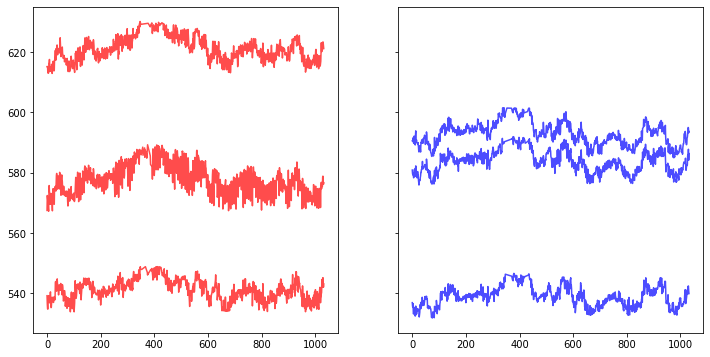

In [118]:
fig, ax = plt.subplots(1,2, sharey=True, figsize=(12,6))
ax = ax.ravel()
ax[0].plot(hand.iloc[:,:3], c='r', alpha=0.7)
ax[1].plot(hand.iloc[:,3:], c='b', alpha=0.7)

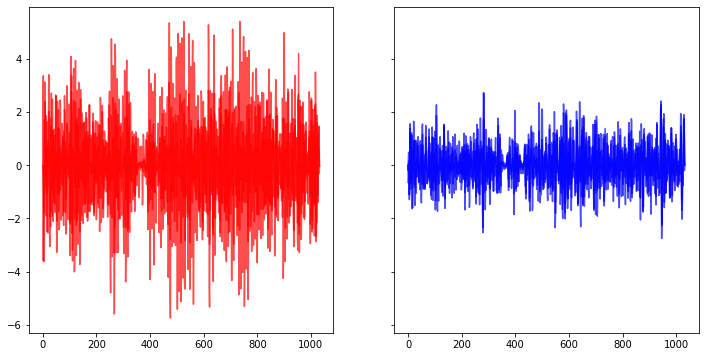

In [131]:
handbp = hand.apply(bandpass).copy()

fig, ax = plt.subplots(3,2, sharey=True, figsize=(12,6))
ax = ax.ravel()
ax[0].plot(handbp.iloc[:,:3], c='r', alpha=0.7)
ax[1].plot(handbp.iloc[:,3:], c='b', alpha=0.7)

In [91]:
tasks = ['Sitng']
scores = pd.read_csv('../Metadata/Table4.csv')
scores = scores.loc[(scores['SubjID'].isin(df.SubjID.unique())) & (scores.TaskAbb.isin(tasks))]
scores = scores[['SubjID','Visit','TaskAbb','Tremor - Left', 'Tremor - Right', 'Bradykinesia - Right', 'Bradykinesia - Left']]
scores.query('Visit != "1 Month"', inplace=True)
scores['Visit']=scores.Visit.apply(lambda x: x.split()[-1])
for i,j in enumerate(scores.Visit.unique()):
    scores.loc[scores.Visit==j, 'Visit'] = i+1
scores = scores.query('Visit ==1 | Visit ==2 | Visit==3')
scores

,SubjID,Visit,TaskAbb,Tremor - Left,Tremor - Right,Bradykinesia - Right,Bradykinesia - Left
414,1009,1,Sitng,0.0,2.0,NaN,NaN
429,1009,2,Sitng,0.0,0.0,NaN,NaN
444,1009,3,Sitng,0.0,0.0,NaN,NaN
729,1019,1,Sitng,2.0,0.0,NaN,NaN
744,1019,2,Sitng,2.0,0.0,NaN,NaN
759,1019,3,Sitng,0.0,0.0,NaN,NaN
2199,1049,1,Sitng,3.0,0.0,NaN,NaN
2214,1049,2,Sitng,1.0,0.0,NaN,NaN
2229,1049,3,Sitng,2.0,0.0,NaN,NaN
2304,1050,1,Sitng,3.0,0.0,NaN,NaN


In [94]:
df.columns

Index(['SubjID', 'Task', 'cycle', 'elbR_x', 'elbR_y', 'elbR_c', 'wriR_x',
       'wriR_y', 'wriR_c', 'elbL_x', 'elbL_y', 'elbL_c', 'wriL_x', 'wriL_y',
       'wriL_c', 'nose_x', 'nose_y', 'nose_c', 'neck_x', 'neck_y', 'neck_c',
       'midHip_x', 'midHip_y', 'midHip_c', 'thumbR_x', 'thumbR_y', 'thumbR_c',
       'indexR_x', 'indexR_y', 'indexR_c', 'midR_x', 'midR_y', 'midR_c',
       'ringR_x', 'ringR_y', 'ringR_c', 'pinkyR_x', 'pinkyR_y', 'pinkyR_c',
       'thumbL_x', 'thumbL_y', 'thumbL_c', 'indexL_x', 'indexL_y', 'indexL_c',
       'midL_x', 'midL_y', 'midL_c', 'ringL_x', 'ringL_y', 'ringL_c',
       'pinkyL_x', 'pinkyL_y', 'pinkyL_c', 'Npeople'],
      dtype='object')

In [ ]:
hand_

### Scores

In [4]:
# scores = pd.read_csv('/Users/luca/Box/CISPD_Videos_proc/Metadata/Table4.csv')
tasks = ['FtnL', 'FtnR', 'RamL', 'RamR', 'SitStand']
scores = pd.read_csv('../Metadata/Table4.csv')
scores = scores.loc[(scores['SubjID'].isin(df.SubjID.unique())) & (scores.TaskAbb.isin(tasks))]
scores = scores[['SubjID','Visit','TaskAbb','Tremor - Left', 'Tremor - Right', 'Bradykinesia - Right', 'Bradykinesia - Left']]
scores.query('Visit != "1 Month"', inplace=True)
scores['Visit']=scores.Visit.apply(lambda x: x.split()[-1])
for i,j in enumerate(scores.Visit.unique()):
    print(i,j)
    scores.loc[scores.Visit==j, 'Visit'] = i+1

scores = scores.query('Visit ==1 | Visit ==2 | Visit==3')
    
scores.head(2)

0 0
1 30
2 60
3 90
4 120
5 150


,SubjID,Visit,TaskAbb,Tremor - Left,Tremor - Right,Bradykinesia - Right,Bradykinesia - Left
108,1004,1,FtnL,1.0,0.0,NaN,1.0
109,1004,1,FtnR,0.0,1.0,1.0,NaN


In [5]:
#subjects with severe symptoms
PD = scores.loc[(scores['Tremor - Left']>2) | (scores['Tremor - Right']>2) | 
           (scores['Bradykinesia - Left']>2) | (scores['Bradykinesia - Right']>2)]

noPD = scores.loc[(scores['Tremor - Left']==0) & (scores['Tremor - Right']==0) | 
           (scores['Bradykinesia - Left']==0) & (scores['Bradykinesia - Right']==0)]

PDsubj = PD.SubjID.unique()
noPDsubj = noPD.SubjID.unique()
print('high symptoms',PDsubj, '\nno symptoms',noPDsubj)

high symptoms [1043 1054 1056] 
no symptoms [1004 1009 1023 1039 1043 1044 1052 1054]


### First label bradyknesia symptoms on right side

In [6]:
#no symptoms right side
no_bradyR=scores.loc[(scores['TaskAbb']=='FtnR') & (scores['Bradykinesia - Right']<1) &
          (scores['Tremor - Right']<1) & (scores['Tremor - Left'] < 1)].copy()
no_bradyR['symptom'] = 0
no_bradyR

,SubjID,Visit,TaskAbb,Tremor - Left,Tremor - Right,Bradykinesia - Right,Bradykinesia - Left,symptom
124,1004,2,FtnR,0.0,0.0,0.0,NaN,0
139,1004,3,FtnR,0.0,0.0,0.0,NaN,0
439,1009,3,FtnR,0.0,0.0,0.0,NaN,0
1579,1039,2,FtnR,0.0,0.0,0.0,NaN,0
1594,1039,3,FtnR,0.0,0.0,0.0,NaN,0
1699,1043,3,FtnR,0.0,0.0,0.0,NaN,0
1774,1044,1,FtnR,0.0,0.0,0.0,NaN,0
1789,1044,2,FtnR,0.0,0.0,0.0,NaN,0
1804,1044,3,FtnR,0.0,0.0,0.0,NaN,0
2524,1052,2,FtnR,0.0,0.0,0.0,NaN,0


In [7]:
#bradkinesia in right side 
bradyR = scores.loc[(scores['Bradykinesia - Right']>=1) & (scores['TaskAbb']=='FtnR')].copy()
bradyR['symptom'] = 1
bradyR

,SubjID,Visit,TaskAbb,Tremor - Left,Tremor - Right,Bradykinesia - Right,Bradykinesia - Left,symptom
109,1004,1,FtnR,0.0,1.0,1.0,NaN,1
409,1009,1,FtnR,1.0,0.0,1.0,NaN,1
424,1009,2,FtnR,0.0,0.0,1.0,NaN,1
934,1023,1,FtnR,1.0,1.0,1.0,NaN,1
949,1023,2,FtnR,1.0,1.0,1.0,NaN,1
1564,1039,1,FtnR,0.0,0.0,1.0,NaN,1
1669,1043,1,FtnR,2.0,1.0,3.0,NaN,1
1684,1043,2,FtnR,0.0,1.0,2.0,NaN,1
2689,1054,1,FtnR,0.0,1.0,2.0,NaN,1
2704,1054,2,FtnR,0.0,0.0,1.0,NaN,1


In [10]:
symptom = pd.concat((bradyR,no_bradyR))

In [14]:
scores.Visit.unique()

array([1, 2, 3], dtype=int64)

In [17]:
#all subjects with severe symptoms
print(PD[['SubjID','TaskAbb','Visit']])

      SubjID   TaskAbb  Visit
1668    1043      FtnL      1
1669    1043      FtnR      1
1671    1043      RamL      1
1672    1043      RamR      1
2691    1054      RamL      1
2706    1054      RamL      2
2886    1056      RamL      2
2899    1056      FtnR      3
2901    1056      RamL      3
2902    1056      RamR      3
2905    1056  SitStand      3


In [17]:
#all subjects with high symptoms
# print(noPD[['SubjID','TaskAbb','Visit']])

In [19]:
(PD[(PD.TaskAbb == 'FtnR' )| (PD.TaskAbb == 'FtnL')])

,SubjID,Visit,TaskAbb,Tremor - Left,Tremor - Right,Bradykinesia - Right,Bradykinesia - Left
1668,1043,1,FtnL,0.0,1.0,NaN,3.0
1669,1043,1,FtnR,2.0,1.0,3.0,NaN
2899,1056,3,FtnR,3.0,2.0,1.0,NaN


In [19]:
(PD[(PD.TaskAbb == 'FtnR' )| (PD.TaskAbb == 'FtnL')])

,SubjID,Visit,TaskAbb,Tremor - Left,Tremor - Right,Bradykinesia - Right,Bradykinesia - Left
1668,1043,1,FtnL,0.0,1.0,NaN,3.0
1669,1043,1,FtnR,2.0,1.0,3.0,NaN
2899,1056,3,FtnR,3.0,2.0,1.0,NaN


In [56]:
scores.query('SubjID==1056 & TaskAbb=="FtnR"')

,SubjID,Visit,TaskAbb,Tremor - Left,Tremor - Right,Bradykinesia - Right,Bradykinesia - Left
2869,1056,1,FtnR,0.0,2.0,1.0,NaN
2884,1056,2,FtnR,2.0,2.0,1.0,NaN
2899,1056,3,FtnR,3.0,2.0,1.0,NaN


In [57]:
scores.query('SubjID==1054 & TaskAbb=="FtnR"')

,SubjID,Visit,TaskAbb,Tremor - Left,Tremor - Right,Bradykinesia - Right,Bradykinesia - Left
2689,1054,1,FtnR,0.0,1.0,2.0,NaN
2704,1054,2,FtnR,0.0,0.0,1.0,NaN
2719,1054,3,FtnR,0.0,0.0,0.0,NaN


In [9]:
noPD.loc[(noPD.SubjID.isin(PDsubj)) & (noPD.TaskAbb=='FtnR')]

,SubjID,Visit,TaskAbb,Tremor - Left,Tremor - Right,Bradykinesia - Right,Bradykinesia - Left
1699,1043,3,FtnR,0.0,0.0,0.0,NaN
2719,1054,3,FtnR,0.0,0.0,0.0,NaN


In [4]:
bodyparts = list(df.columns)
bodyparts = [b for b in bodyparts if ('R' in b or 'L' in b) and ('_c' not in b)]
bodyparts
for b in bodyparts:
    print(b, df[b].min(), df[b].max())

elbR_x 0.0 1801.83
elbR_y 0.0 1074.89
wriR_x 0.0 1751.78
wriR_y 0.0 1074.88
elbL_x 0.0 1851.85
elbL_y 0.0 1074.88
wriL_x 0.0 1607.43
wriL_y 0.0 1048.27
thumbR_x 0.0 1733.31
thumbR_y 0.0 1205.05
indexR_x 0.0 1739.38
indexR_y -10.8863 1182.62
thumbL_x 0.0 1543.89
thumbL_y 0.0 1159.17
indexL_x 0.0 1563.14
indexL_y -22.5093 1105.52


# Plot FTNR tasks for all users

In [298]:
# s = '1004'
# dfs = df.query('SubjID == @s & Task=="FtnR"')

# #remove outliers 
# L = (np.sqrt( (dfs.midHip_x -dfs.neck_x)**2 + (dfs.midHip_y-dfs.neck_y)**2) ) #trunk length
# sns.distplot(L)
# z = np.abs(stats.zscore(L)) 
# # plt.hist(z)
# # plt.hist(L[z<3]) #remove outliers
# # sns.plot()
# # plt.hist(z)

# # L.plot(kind='box')

In [98]:
# wriR = np.sqrt(dfs.wriR_x**2 + dfs.wriR_y**2)
# wriL = np.sqrt(dfs.wriL_x**2 + dfs.wriL_y**2)
# indexR = np.sqrt(dfs.indexR_x**2 + dfs.indexR_y**2)
# indexL = np.sqrt(dfs.indexL_x**2 + dfs.indexL_y**2)
# thumbR = np.sqrt(dfs.thumbR_x**2 + dfs.thumbR_y**2)
# thumbL = np.sqrt(dfs.thumbL_x**2 + dfs.thumbL_y**2)

<IPython.core.display.Javascript object>


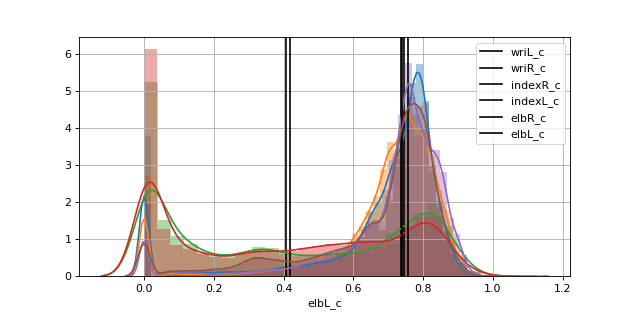

In [138]:
joints = ['wriL_c', 'wriR_c', 'indexR_c', 'indexL_c', 'elbR_c', 'elbL_c']
plt.figure(figsize=(8,4))
for j in joints:
    plt.axvline(df[j].median(), c='k')
    sns.distplot(df[j])
plt.legend(joints)
plt.grid()

### Example interpolations

In [87]:
s = 1043
task = 'RamR'
dfs = df.query('SubjID == @s & Task==@task & cycle==1').copy()    
dfs.head(2)

,SubjID,Task,cycle,elbR_x,elbR_y,elbR_c,wriR_x,wriR_y,wriR_c,elbL_x,...,midL_x,midL_y,midL_c,ringL_x,ringL_y,ringL_c,pinkyL_x,pinkyL_y,pinkyL_c,Npeople
frame#,,,,,,,,,,,,,,,,,,,,,
0,1043,RamR,1,357.379,204.622,0.780525,392.581,167.865,0.817459,570.282,...,576.801,453.904,0.454282,581.454,453.904,0.466785,587.538,448.177,0.397253,1
1,1043,RamR,1,358.792,204.625,0.785619,392.648,164.967,0.808102,570.307,...,577.600,454.302,0.515490,582.168,454.654,0.480434,587.439,448.680,0.431739,1


thumbR_x    0.022222
thumbR_y    0.022222
indexR_x    0.022222
indexR_y    0.022222
midR_x      0.022222
midR_y      0.022222
ringR_x     0.022222
ringR_y     0.022222
pinkyR_x    0.022222
pinkyR_y    0.022222
dtype: float64
fit failed {} pinkyR


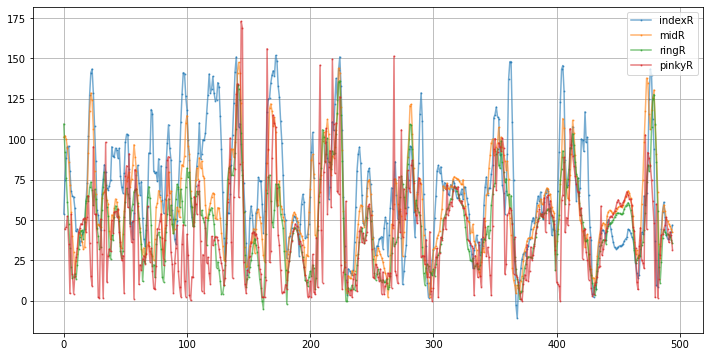

In [100]:
plot_hand_orientation(df, 1043, cycle=1, fingers=None)

In [77]:
hand, trunk, hR, theta_all = handpose(dfs)
theta_all_c = pd.DataFrame(data=[], columns=theta_all.columns)
for i in theta_all_c.columns:
    theta_all_c[i] = dfs[i+'_c'] 

thumbR_x    0.022222
thumbR_y    0.022222
indexR_x    0.022222
indexR_y    0.022222
midR_x      0.022222
midR_y      0.022222
ringR_x     0.022222
ringR_y     0.022222
pinkyR_x    0.022222
pinkyR_y    0.022222
dtype: float64


In [94]:
theta_all.columns

Index(['indexR', 'midR', 'ringR', 'pinkyR'], dtype='object')

<IPython.core.display.Javascript object>


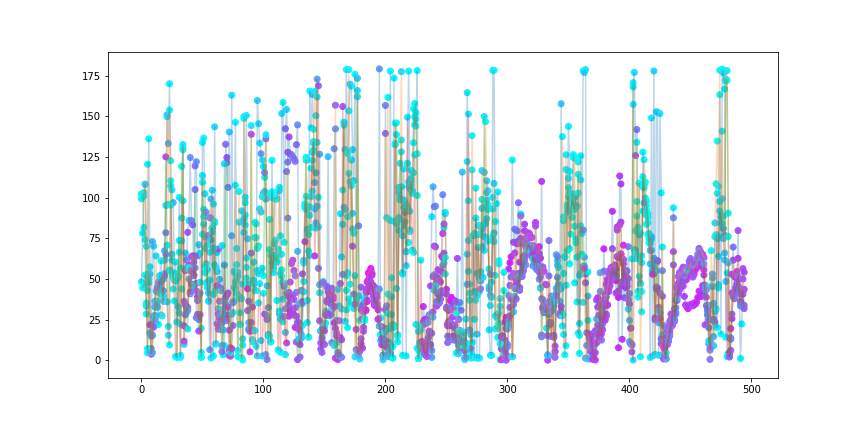

In [80]:
fig = plt.figure(figsize=(12,6))
for i in theta_all.columns:
    plt.scatter(theta_all.index, theta_all[i], c=theta_all_c[i], cmap='cool', vmin=0, vmax=1)
    plt.plot(theta_all.index, theta_all[i], alpha = 0.3)
    

<IPython.core.display.Javascript object>


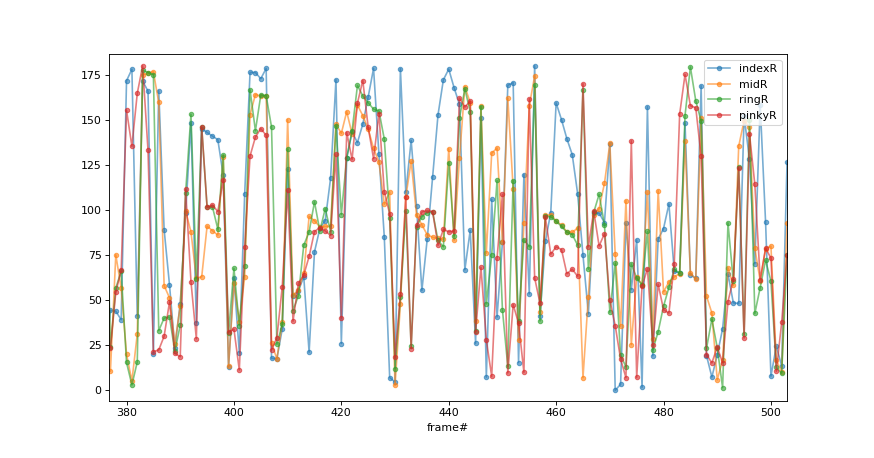

In [13]:
theta_all.plot(style='.-', alpha=0.6, markersize=8)

<IPython.core.display.Javascript object>


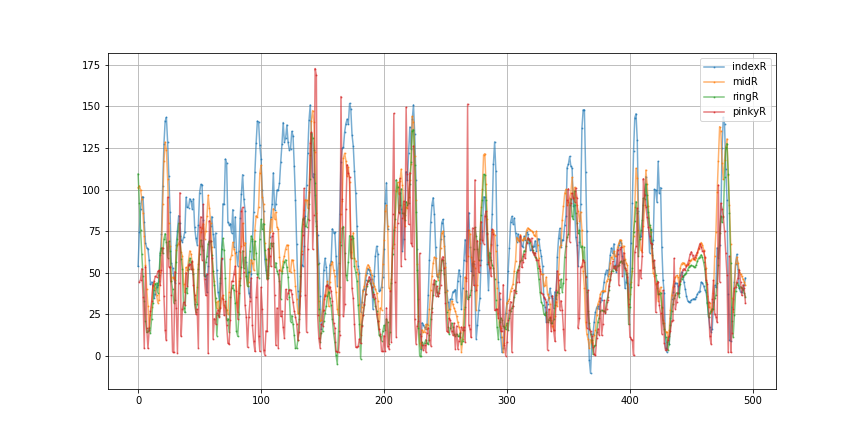

fit failed {} pinkyR


In [81]:
for i in theta_all.columns:
# ['indexR', 'pinkyR']:
    try:
        plt.plot(signal.savgol_filter(theta_all[i].values, 9,2),'.-', markersize=2, alpha=0.6)
    except:
        plt.plot(theta_all[i], '.-', markersize=2, alpha=0.6)
        print('fit failed {}',i)

# plt.legend(['indexR', 'pinkyR'])
plt.legend(theta_all.columns)
plt.grid()

In [45]:
theta_all_c = pd.DataFrame(data=[], columns=theta_all.columns)
for i in theta_all_c.columns:
    theta_all_c[i] = dfs[i+'_c'] 

<IPython.core.display.Javascript object>


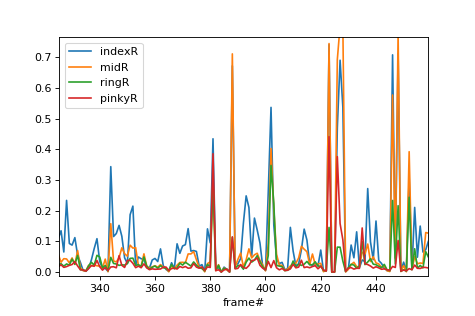

In [49]:
theta_all_c.plot()

In [59]:
theta_all_c.sum(axis=1)

frame#
0      0.098969
1      0.084765
2      0.010277
3      0.007821
4      0.000000
         ...   
499    0.582594
500    0.129523
501    0.097872
502    0.521332
503    0.380231
Length: 504, dtype: float64

<IPython.core.display.Javascript object>


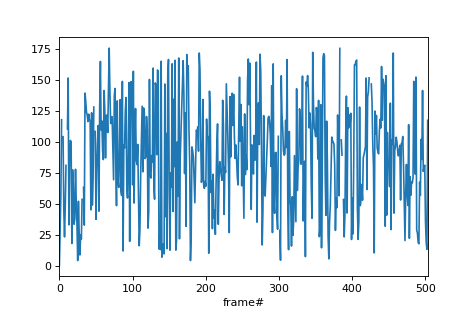

In [61]:
(np.sum(theta_all*theta_all_c, axis=1) / (theta_all_c.sum(axis=1))).plot()

<IPython.core.display.Javascript object>


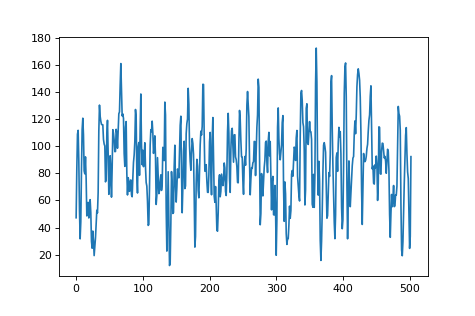

In [39]:
theta_allm = theta_all.mean(axis=1)
xfilt = signal.filtfilt(b,a,theta_allm.dropna())
plt.plot(xfilt)

In [20]:
Fs = 30
x = theta_all.pinkyR.dropna()
cutoff = 10
cutoff_norm = cutoff/(0.5*Fs)
b,a = butter(1,cutoff_norm,btype='lowpass',analog=False)
xfilt = signal.filtfilt(b,a,x)

<IPython.core.display.Javascript object>


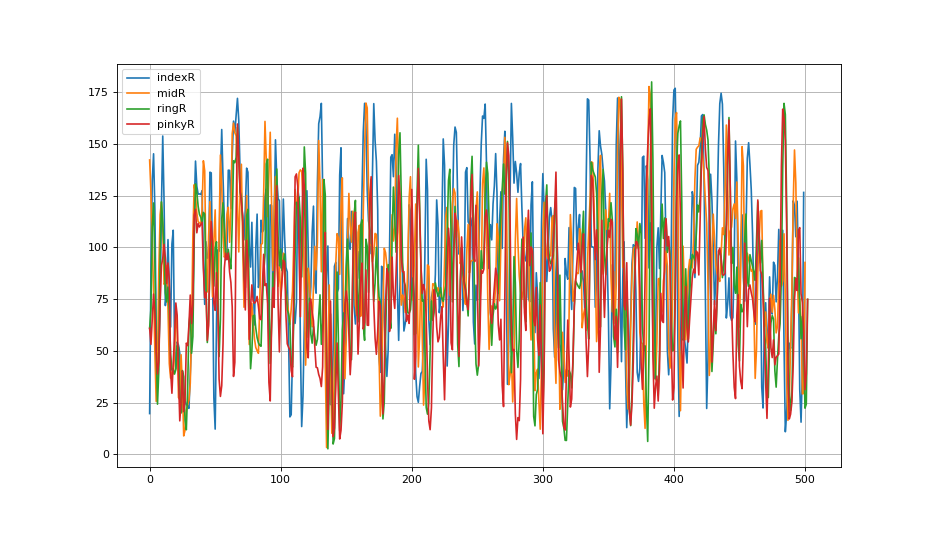

In [37]:
Fs = 30
cutoff = 8
cutoff_norm = cutoff/(0.5*Fs)
b,a = butter(1,cutoff_norm,btype='lowpass',analog=False)

for i in theta_all.columns:
# ['indexR', 'pinkyR']:
    try:
        xfilt = signal.filtfilt(b,a,theta_all[i].dropna())
        plt.plot(xfilt)
#         plt.plot(signal.savgol_filter(theta_all[i].values, 9,2),'.-', markersize=2, alpha=0.6)
        
    except:
        plt.plot(theta_all[i], '.-', markersize=2, alpha=0.6)
        print('fit failed {}',i)

# plt.legend(['indexR', 'pinkyR'])
plt.legend(theta_all.columns)
plt.grid()

In [27]:
plt.plot(theta_all['pinkyR'],'o-')

<IPython.core.display.Javascript object>


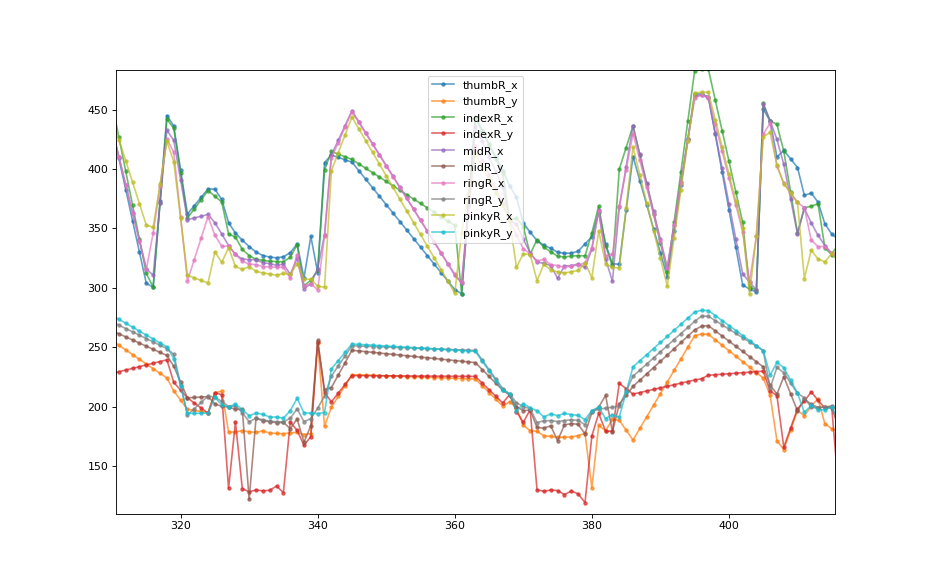

In [12]:
hand.plot(style='.-', alpha=0.7)

<IPython.core.display.Javascript object>


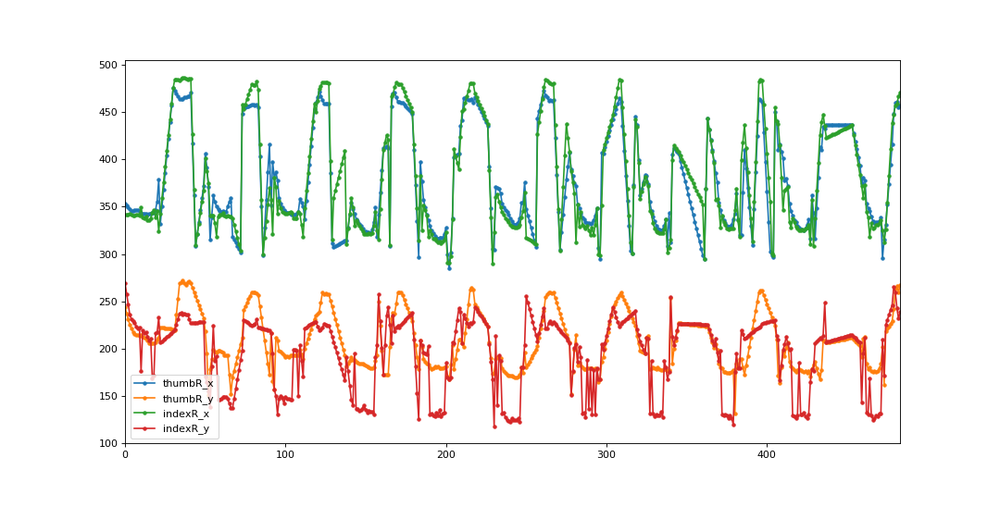

In [144]:
hand = pd.DataFrame()
joints = ['thumbR_','indexR_']
xs = ['x','y']
for jj in product(joints,xs):
    j = ''.join(jj)
    hand = pd.concat((hand,data[j]), axis=1)
# hand.head()
hand[hand==0] = np.nan
nmissed = max(hand.isnull().sum()/len(hand))
if nmissed > 0.5:
    print('more than 50% frames miss a finger detection!')
#interpolate
hand = hand.apply(removeOutliers,args=(2,False,True))
hand.plot(style = '.-')

In [104]:
hand.columns

Index(['thumbR_x', 'thumbR_y', 'indexR_x', 'indexR_y'], dtype='object')

In [79]:
for j in ['thumbR_','indexR_']:
    j+'x'
    data.loc[data[j] == 0, j] = np.nan
    
hand = pd.DataFrame({'x':data.thumbR_x-data.indexR_x, 'y':data.thumbR_y-data.indexR_y})
hand.x = removeOutliers(hand.x, returnZ=False, interp=True)
hand.y = removeOutliers(hand.y, returnZ=False, interp=True)

KeyError: 'thumb_'

<IPython.core.display.Javascript object>


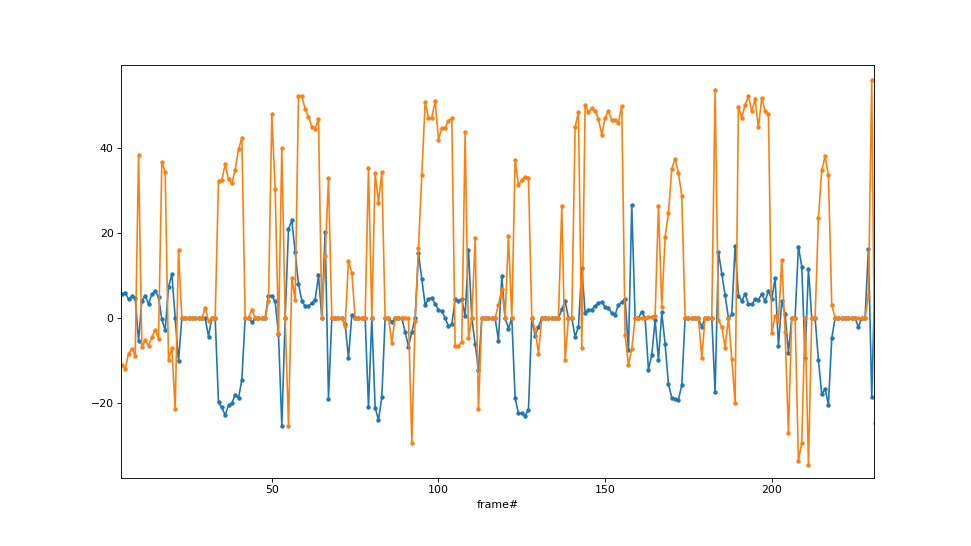

In [77]:
hand.x.plot(style='.-')
hand.y.plot(style='.-')

In [12]:
data = dfs.copy()
jj = 'wriR_'
#remove missed detections (0s in both coords) for current joint
data = data[ (data[jj+'x'] > 0) & (data[jj+'y'] > 0)]

#normalization factor (hip length)    
L = (np.sqrt( (data.midHip_x -data.neck_x)**2 + (data.midHip_y-data.neck_y)**2) ) #trunk length (ref length)            
L = removeOutliers(L, 2, returnZ=False) #remove outliers and linearly interpolate

#Detrend data: distance from nose (ref point) normalized by trunk length
p = (np.sqrt((data[jj+'x'] - data.nose_x)**2 + (data[jj+'y'] - data.nose_y)**2))/L 
data[jj] = p 

#outlier rejection
data[jj] = removeOutliers(data[jj],2, returnZ=False, interp=False) #remove outliers - do not interpolate
# data.dropna(inplace=True)

<IPython.core.display.Javascript object>


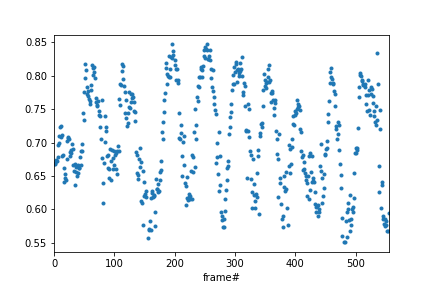

In [13]:
Fs = 30
(data[jj]).plot(style='.')
try:
    data[jj] = signal.savgol_filter(data[jj], 13, 2)
except:
    cutoff = 10
    cutoff_norm = cutoff/(0.5*Fs)
    b,a = butter(1,cutoff_norm,btype='lowpass',analog=False)
    xfilt = signal.filtfilt(b,a,data[jj])

plt.plot(xfilt)
    

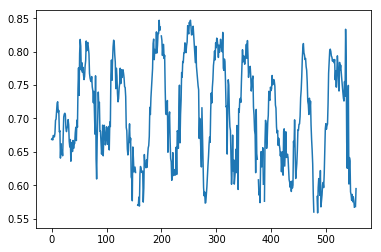

In [11]:
x = data[jj].values
plt.plot(x)



/anaconda3/lib/python3.7/site-packages/scipy/signal/_arraytools.py:45: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  b = a[a_slice]


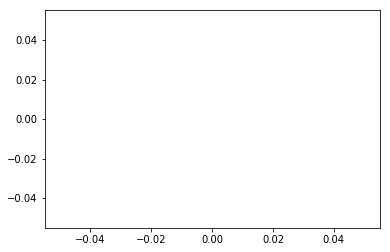

In [14]:
Fs = 30
cutoff = 3
cutoff_norm = cutoff/(0.5*Fs)
b,a = butter(2,cutoff_norm,btype='highpass',analog=False)
xfilt = filtfilt(b,a,x)
plt.plot(xfilt)

In [106]:
# Sz = stats.zscore(L)
# Snew = L.copy()
# Snew[np.abs(Sz)>2] = np.nan
# Snew = Snew.interpolate()
# Snew.interpolate('nearest')

In [134]:
data = dfs.copy()
jj = 'wriR_'

#remove missed detections (0s in both coords) for current joint
data = data[ (data[jj+'x'] > 0) & (data[jj+'y'] > 0)]

#normalization factor (hip length)    
L = (np.sqrt( (data.midHip_x -data.neck_x)**2 + (data.midHip_y-data.neck_y)**2) ) #trunk length (ref length)            
L = removeOutliers(L,2) #remove outliers and linearly interpolate

#Detrend data: distance from nose (ref point) normalized by trunk length
p = (np.sqrt((data[jj+'x'] - data.nose_x)**2 + (data[jj+'y'] - data.nose_y)**2))/L 
data[jj] = p 
data.dropna(inplace=True)
data.head()
#             data[jj] = stats.zscore(p)             #z-score data

#outlier rejection
data[jj] = removeOutliers(data[jj],2)
#             data = data[np.abs(data[jj]) < d_threshold] 

#filter 
data[jj+'filt'] = signal.savgol_filter(data[jj], 13, 2)



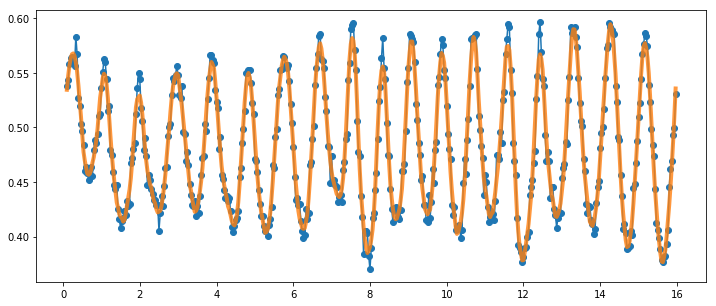

In [135]:
plt.figure(figsize=(12,5))
plt.plot(data[jj].index/30, data[jj].values, 'o-')
# #apply filter
plt.plot(data.index.values/30, signal.savgol_filter(data[jj], 13, 2), '-', LineWidth=4, alpha=0.8, label='SavGol filter')


In [24]:
# data[jj].isnull()

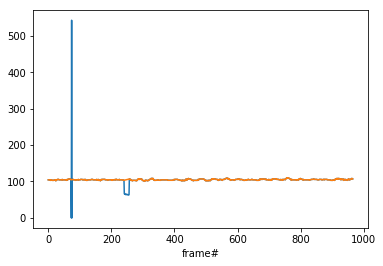

In [88]:
Lnew = removeOutliers(L,2)
L.plot()
Lnew.plot()

In [54]:
joints = [ 'elbL_', 'elbR_', 'wriL_', 'wriR_', 'thumbL_', 'thumbR_','indexL_', 'indexR_',]
for j in joints:
    dfs = dfs[ (dfs[j+'x'] > 0) & (dfs[j+'y'] > 0)]

<IPython.core.display.Javascript object>


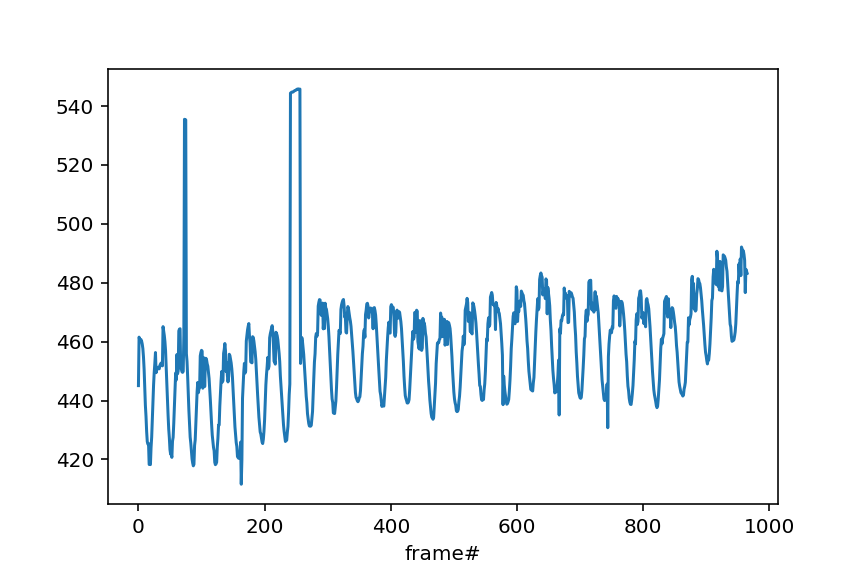

In [59]:
dfs.indexR_x.plot() #remove 0s as non detections

In [211]:
#x is horizontal 
print(dfs.midHip_x.mean(), dfs.neck_x.mean())
print(dfs.midHip_y.mean(), dfs.neck_y.mean())

937.2092989864872 884.9413902027021
772.9071250000001 399.5755489864863


In [14]:
def plot_joint_trajectory_norm(df, task='FtnR', subjs='All', cycle=1, size=8, colormap=False):
    
    markers = ('o', 'v', '^', '<', '>', '8', 's', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X')
    joints = ['wriL_', 'wriR_', 'thumbL_', 'thumbR_','indexL_', 'indexR_',]
    p_joints = {} #trajectory for each joint (relative to reference point)
    frame_rate = 30 #pretty much the same across movies
    
    T = 20 #end plot time [s]
    d_threshold = 2 #max distance (from nose) above which a pose is discarded  
        
    if subjs == 'All':
        subjs = df.SubjID.unique()
        
    fig, ax = plt.subplots(3,2, sharex=True, figsize=(12,12))
    ax = ax.ravel()
    
    for si, s in enumerate(subjs):

        dfs = df.query('SubjID == @s & Task==@task & cycle==@cycle').copy()    
        dfs = dfs[:int(T*frame_rate)]
        
        if dfs.empty:
            print('no data found for {}, {}, cycle {}'.format(s, task, cycle))
            continue
                
        for i, jj in enumerate(joints):
            
            data = dfs.copy()
            #remove missed detections (0s in both coords) for current joint
            data = data[ (data[jj+'x'] > 0) & (data[jj+'y'] > 0)]
            
            #normalization factor (hip length)    
            L = (np.sqrt( (data.midHip_x -data.neck_x)**2 + (data.midHip_y-data.neck_y)**2) ) #trunk length (ref length)            
            L = removeOutliers(L, 2, returnZ=False) #remove outliers and linearly interpolate
                        
            #Detrend data: distance from nose (ref point) normalized by trunk length
            p = (np.sqrt((data[jj+'x'] - data.nose_x)**2 + (data[jj+'y'] - data.nose_y)**2))/L 
            data[jj] = p 

            #outlier rejection
            data[jj] = removeOutliers(data[jj],2, returnZ=False, interp=False) #remove outliers - do not interpolate
            data.dropna(inplace=True)

            #filter 
            try:
                data[jj+'filt'] = signal.savgol_filter(data[jj], 13, 2)
            except:
                print('error fitting filter on ', s, jj, len(data[jj]))
                data[jj+'filt'] = data[jj]
                        
            t = data.index/frame_rate
            if colormap == False:
                ax[i].scatter(t, data[jj], s=size, alpha=0.6); 
#                 ax[i].plot(t, data[jj], LineWidth=.5)
                ax[i].plot(t, data[jj+'filt'], LineWidth=2)
            else:
                ax[i].scatter(t, data[jj], s=size, alpha=0.6, c=data[jj+'c'], cmap='cool', marker=markers[si], vmin=0, vmax=1); 
#                 ax[i].plot(t, data[jj], LineWidth=.5)
                ax[i].plot(t, data[jj+'filt'], LineWidth=2)
                
            ax[i].set_title(jj+task+str(cycle))
            p_joints.update({jj:p})    
                    
    for i in range(len(joints)):
        ax[i].grid()
        ax[i].legend(subjs)
        

## Ftn

no data found for 1052, FtnR, cycle 1
no data found for 1054, FtnR, cycle 1


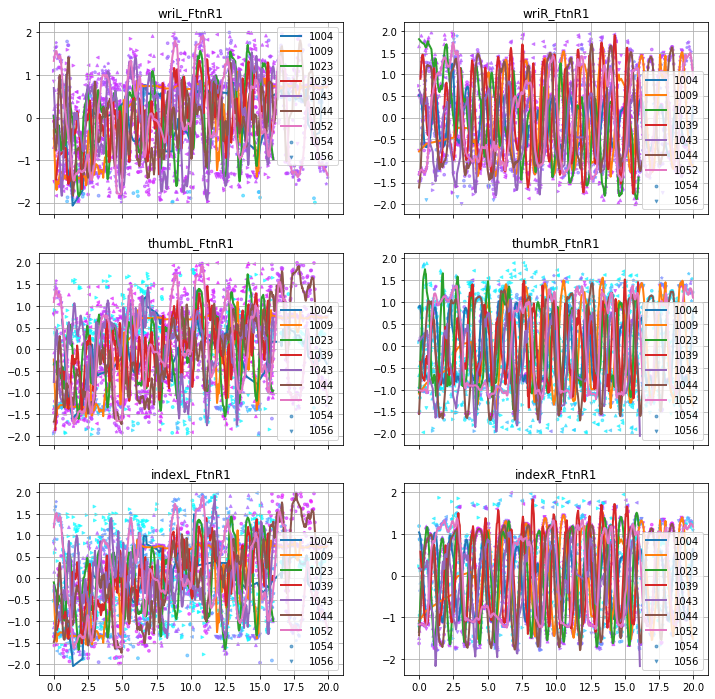

In [129]:

plot_joint_trajectory_norm(df, 'FtnR', colormap=True)
plt.savefig('../Figs/FtnR1_All.jpg', dpi=300)

no data found for 1052, FtnR, cycle 1
no data found for 1054, FtnR, cycle 1


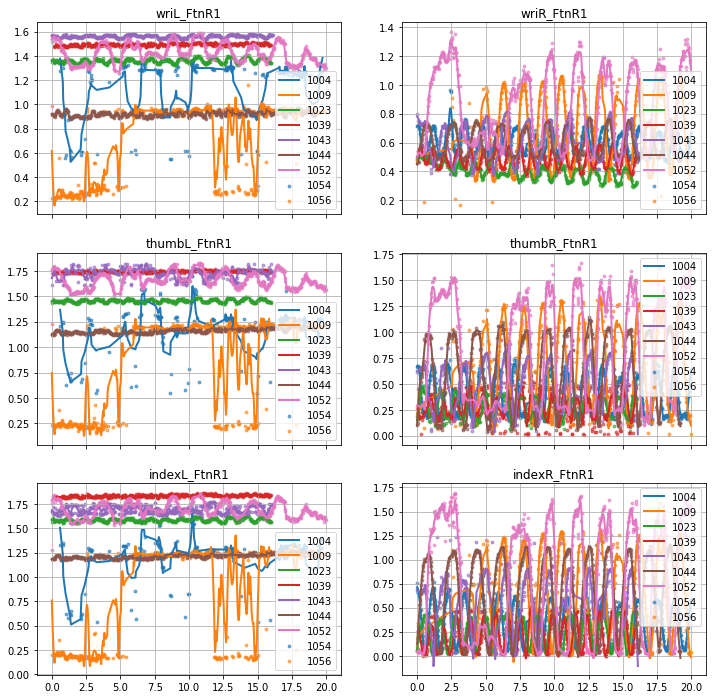

In [172]:

plot_joint_trajectory_norm(df, 'FtnR', colormap=False)
# plt.savefig('../Figs/FtnR1_All.jpg', dpi=300)

no data found for 1052, RamR, cycle 1
no data found for 1054, RamR, cycle 1


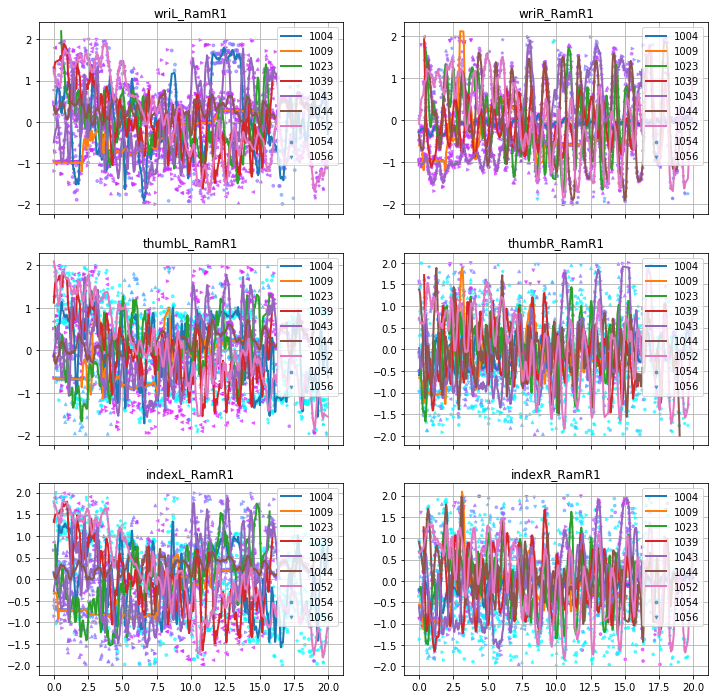

In [7]:
plot_joint_trajectory_norm(df, 'RamR', colormap=True)
# plt.savefig('../Figs/FtnR1_All.jpg', dpi=300)

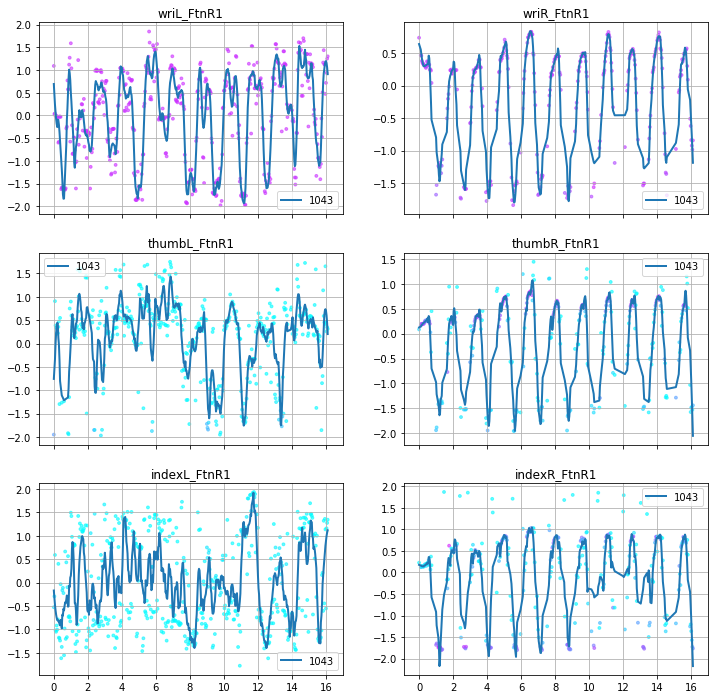

In [130]:
plot_joint_trajectory_norm(df,'FtnR',['1043'],colormap=True)
plt.savefig('../Figs/FtnR1_1043.jpg', dpi=300)

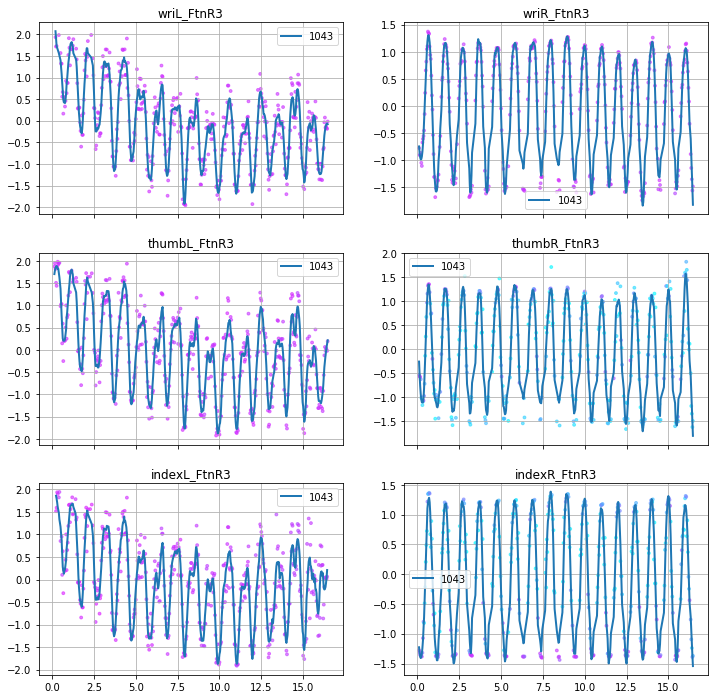

In [131]:
plot_joint_trajectory_norm(df,'FtnR',['1043'],cycle=3,colormap=True)
plt.savefig('../Figs/FtnR3_1043.jpg', dpi=300)

<IPython.core.display.Javascript object>


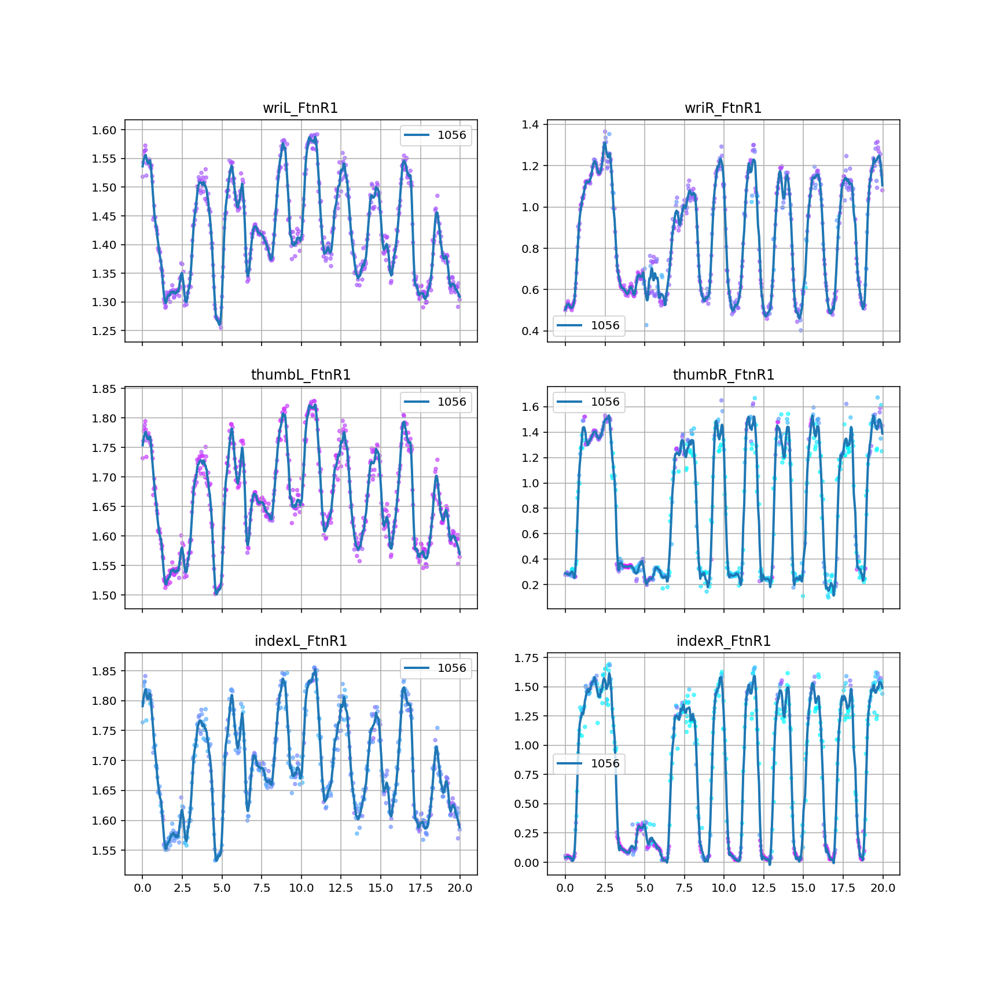

In [50]:
plot_joint_trajectory_norm(df,'FtnR',['1056'],cycle=1,colormap=True)

## Trajectory and PSD for Subjects with bradykinesia in right side
### FtnR

In [89]:
#individuals with bradkinesia > 0
#note that some videos do not exist and some individuals with low bradykinesia score seem to have dyskinesia (e.g 1039,3)
bradyR

,SubjID,Visit,TaskAbb,Tremor - Left,Tremor - Right,Bradykinesia - Right,Bradykinesia - Left,symptom
109,1004,1,FtnR,0.0,1.0,1.0,NaN,1
409,1009,1,FtnR,1.0,0.0,1.0,NaN,1
424,1009,2,FtnR,0.0,0.0,1.0,NaN,1
934,1023,1,FtnR,1.0,1.0,1.0,NaN,1
949,1023,2,FtnR,1.0,1.0,1.0,NaN,1
1564,1039,1,FtnR,0.0,0.0,1.0,NaN,1
1669,1043,1,FtnR,2.0,1.0,3.0,NaN,1
1684,1043,2,FtnR,0.0,1.0,2.0,NaN,1
2689,1054,1,FtnR,0.0,1.0,2.0,NaN,1
2704,1054,2,FtnR,0.0,0.0,1.0,NaN,1


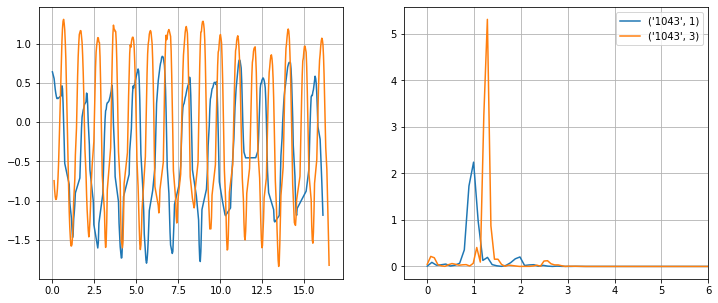

In [99]:
fig, ax = plt.subplots(1,2, figsize=(12,5))
plot_PSD(df,['1043'],'wriR_','FtnR',[1,2,3],ax, alpha=1)

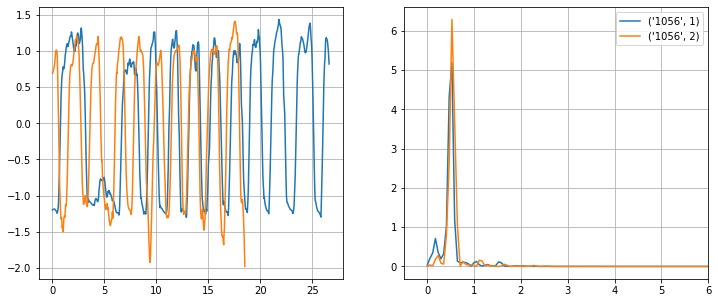

In [100]:
fig, ax = plt.subplots(1,2, figsize=(12,5))
plot_PSD(df,['1056'],'indexR_','FtnR',[1,2,3],ax, alpha=1)

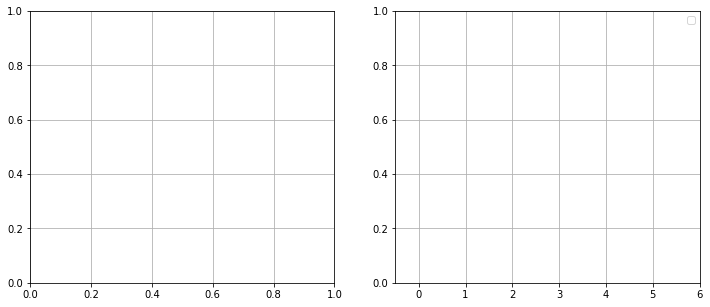

In [91]:
fig, ax = plt.subplots(1,2, figsize=(12,5))
plot_PSD(df,['1054'],'indexR_','FtnR',[3],ax) #need to run pose on videos - also no video available for cycle 1

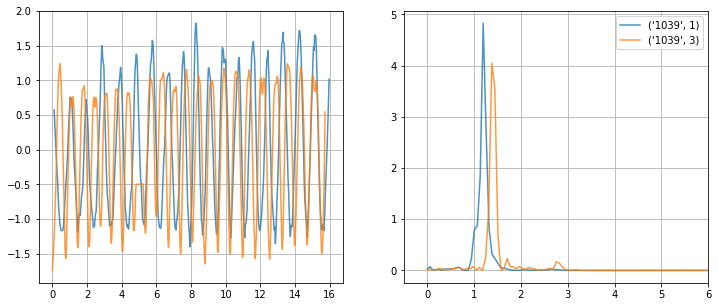

In [95]:
fig, ax = plt.subplots(1,2, figsize=(12,5))
plot_PSD(df,['1039'],'indexR_','FtnR',[1,2,3],ax, alpha=0.8)

### RamR

In [8]:
#bradkinesia in right side 
bradyR = scores.loc[(scores['Bradykinesia - Right']>=2) & (scores['TaskAbb']=='RamR')].copy()
bradyR['symptom'] = 1
bradyR

,SubjID,Visit,TaskAbb,Tremor - Left,Tremor - Right,Bradykinesia - Right,Bradykinesia - Left,symptom
412,1009,1,RamR,1.0,0.0,2.0,NaN,1
1672,1043,1,RamR,2.0,2.0,3.0,NaN,1
1687,1043,2,RamR,1.0,1.0,2.0,NaN,1
2512,1052,1,RamR,0.0,1.0,2.0,NaN,1
2692,1054,1,RamR,0.0,0.0,2.0,NaN,1
2872,1056,1,RamR,2.0,1.0,2.0,NaN,1
2887,1056,2,RamR,1.0,2.0,2.0,NaN,1
2902,1056,3,RamR,3.0,2.0,2.0,NaN,1


Despite the high confidence in hand joint detections, the angle inference is not meaningful here - in this case the camera angle is such that estimation of the angle is not meaningful

frac detection missing: 0.05506607929515418


<IPython.core.display.Javascript object>


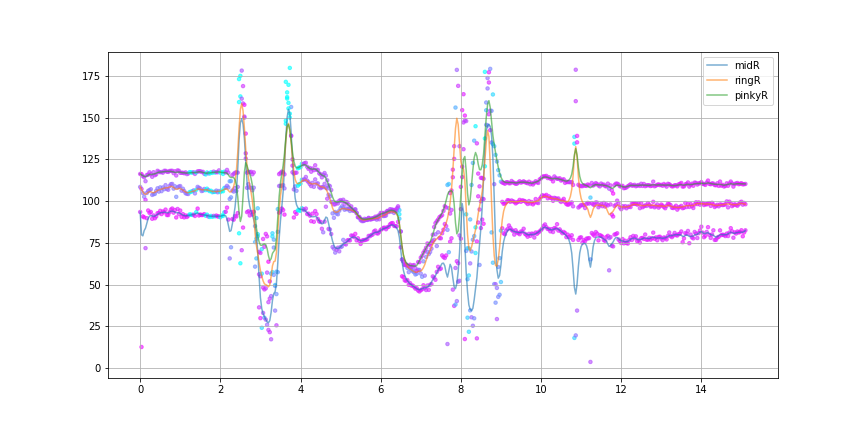

median confidence midR = 0.8735085
median confidence ringR = 0.6959200000000001
median confidence pinkyR = 0.8080080000000001


In [8]:
plot_hand_orientation(df, 1009)

In [68]:
dfs = df.query('SubjID==1043 & Task=="RamR" & cycle==1')
hand, trunk, theta_all, theta_all_c = handpose(dfs)

frac detection missing: 0.022222222222222223


frac detection missing: 0.022222222222222223


<IPython.core.display.Javascript object>


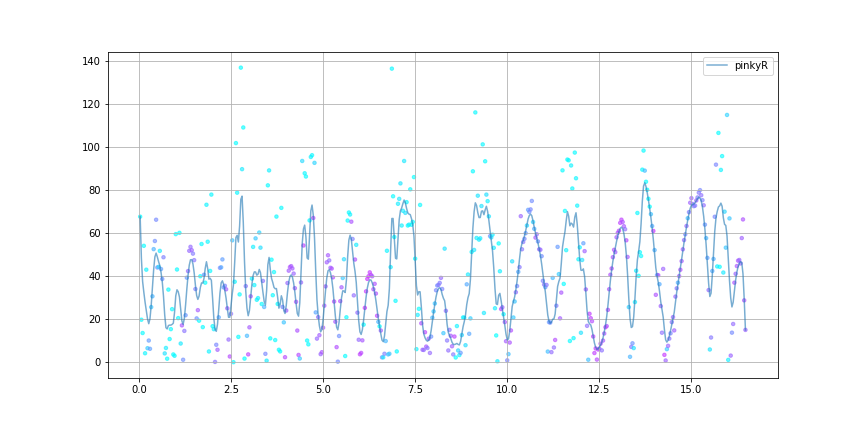

median confidence pinkyR = 0.3993235


In [80]:
plot_hand_orientation(df, 1043, cycle=1, fingers=['pinkyR'])

<IPython.core.display.Javascript object>


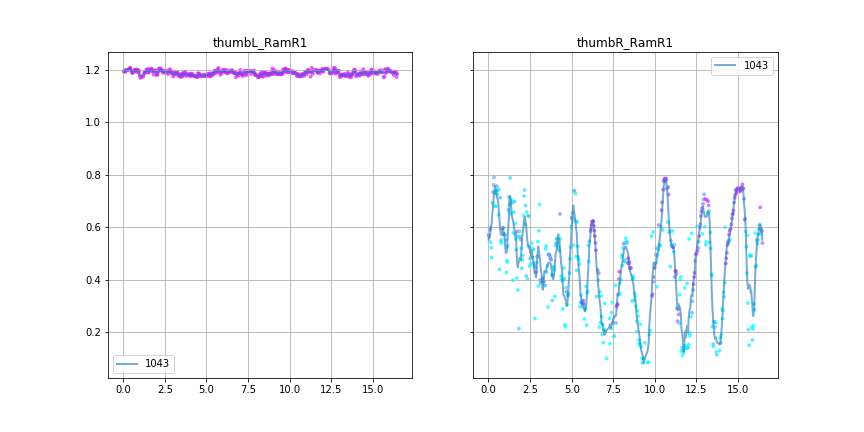

In [95]:
plot_joint_trajectory(df, joint='thumb', task='RamR', subjs=[1043], colormap=True, zscore=False)

frac detection missing: 0.01984126984126984


<IPython.core.display.Javascript object>


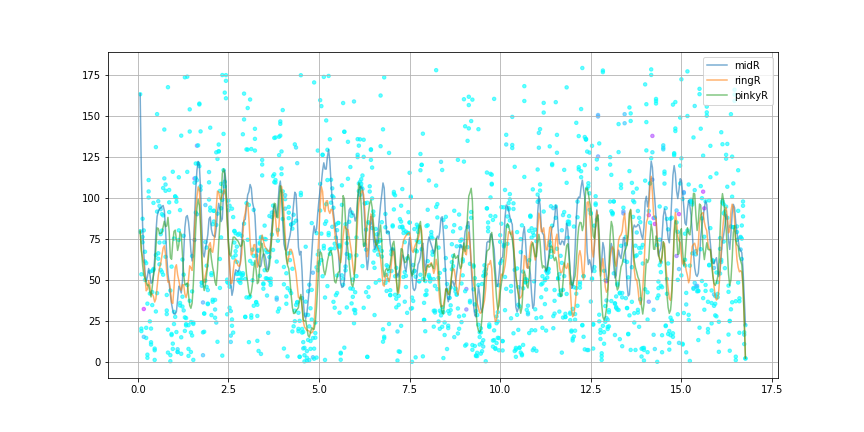

median confidence midR = 0.0237729
median confidence ringR = 0.0199506
median confidence pinkyR = 0.01339835


In [81]:
plot_hand_orientation(df, 1043, cycle=3)

frac detection missing: 0.0


<IPython.core.display.Javascript object>


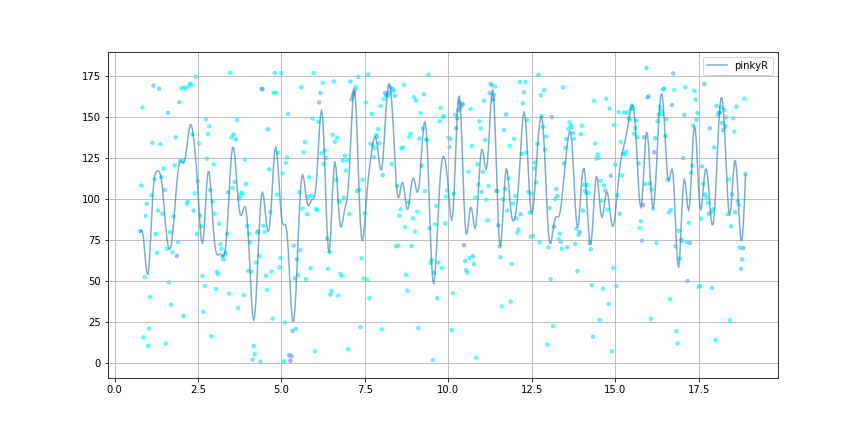

median confidence pinkyR = 0.051309400000000005


In [92]:
plot_hand_orientation(df, 1052, cycle=2, fingers=['pinkyR'])

frac detection missing: 0.1043956043956044


<IPython.core.display.Javascript object>


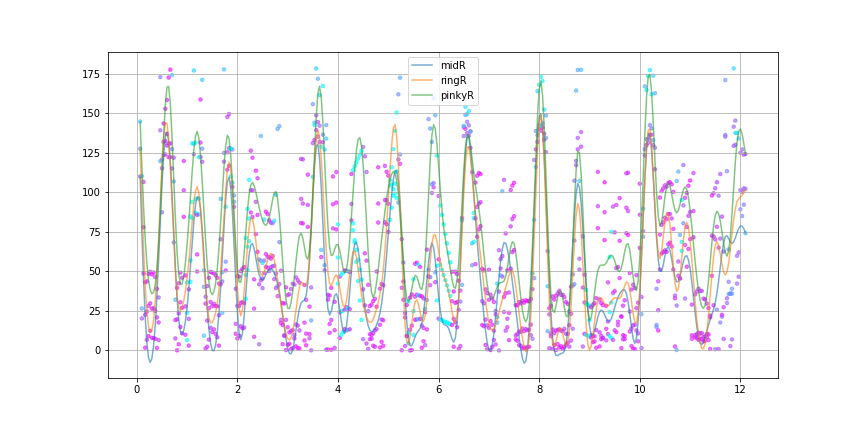

median confidence midR = 0.8381835
median confidence ringR = 0.7961400000000001
median confidence pinkyR = 0.787371


In [93]:
plot_hand_orientation(df, 1054, cycle=2, fingers=None)

frac detection missing: 0.04383116883116883


<IPython.core.display.Javascript object>


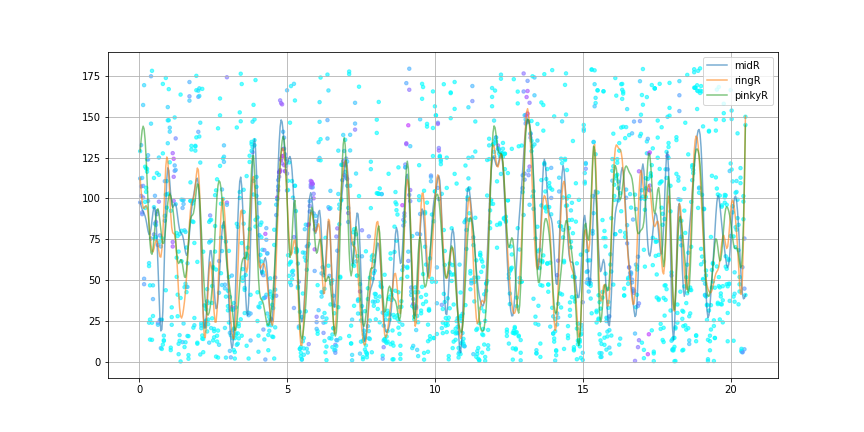

median confidence midR = 0.0343913
median confidence ringR = 0.036256199999999995
median confidence pinkyR = 0.0282548


In [94]:
plot_hand_orientation(df, 1056, cycle=1, fingers=None)

<IPython.core.display.Javascript object>


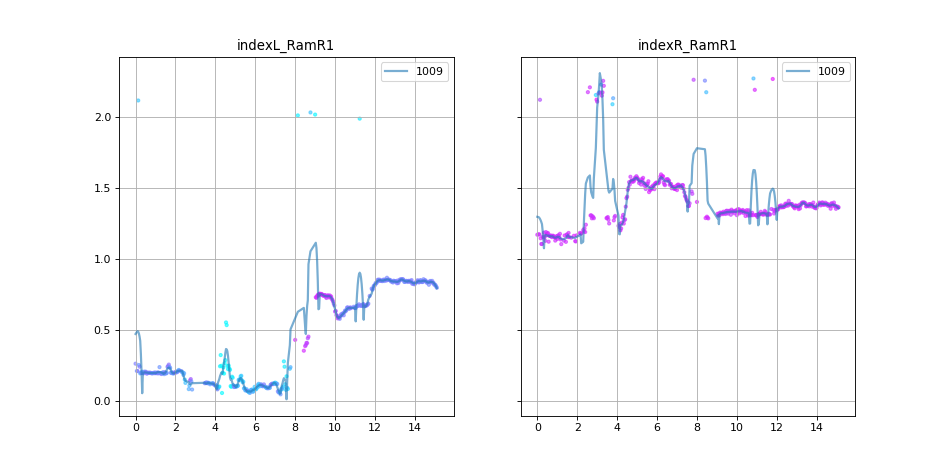

In [26]:
plot_joint_trajectory(df, joint='index', task='RamR', subjs=[1009], colormap=True, zscore=False)

<IPython.core.display.Javascript object>


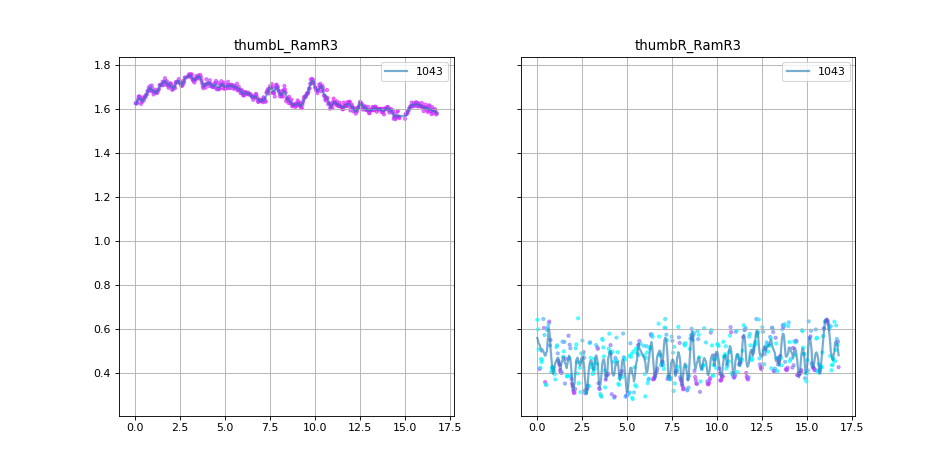

In [22]:
plot_joint_trajectory(df, joint='thumb', task='RamR', cycle=3, subjs=[1043], colormap=True, zscore=False)

<IPython.core.display.Javascript object>


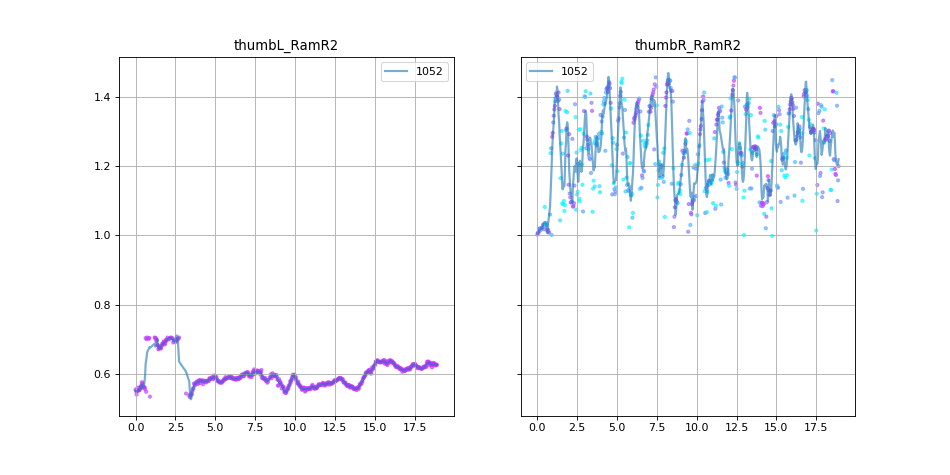

In [28]:
plot_joint_trajectory(df, joint='thumb', task='RamR', cycle=2, subjs=[1052], colormap=True, zscore=False)

<IPython.core.display.Javascript object>


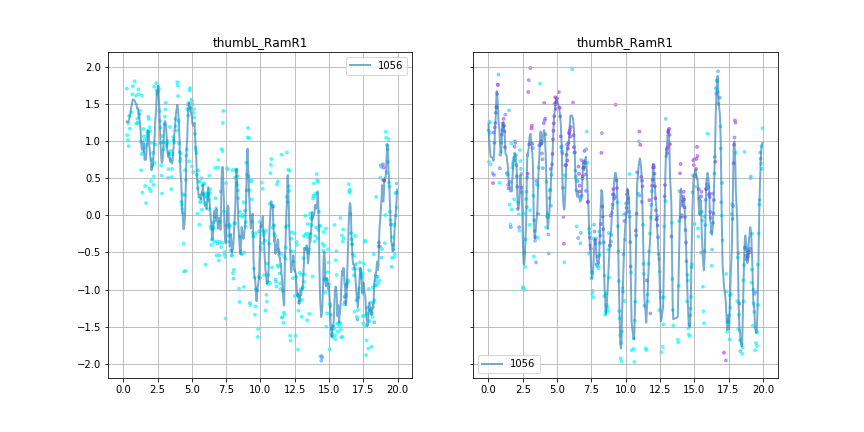

In [96]:
plot_joint_trajectory(df, joint='thumb', task='RamR', cycle=1, subjs=[1056], colormap=True, zscore=True)

<IPython.core.display.Javascript object>


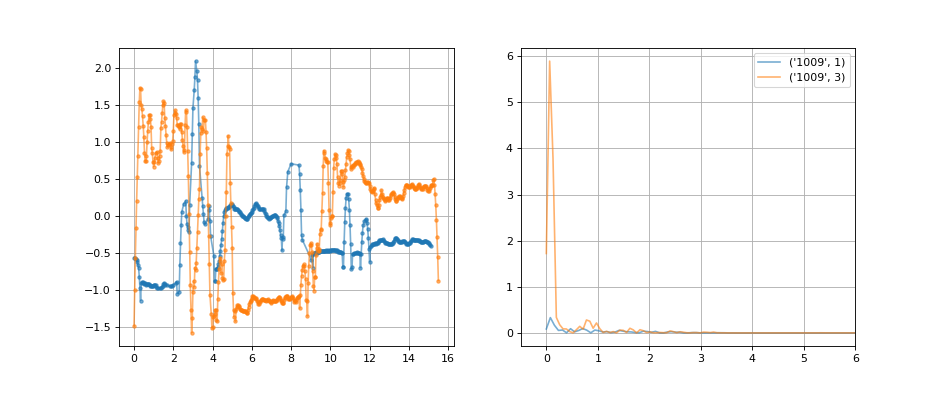

In [23]:
fig, ax = plt.subplots(1,2, figsize=(12,5))
plot_PSD(df,['1009'],'indexR_','RamR',[1,2,3],ax, alpha=0.6) #wrong detections

<IPython.core.display.Javascript object>


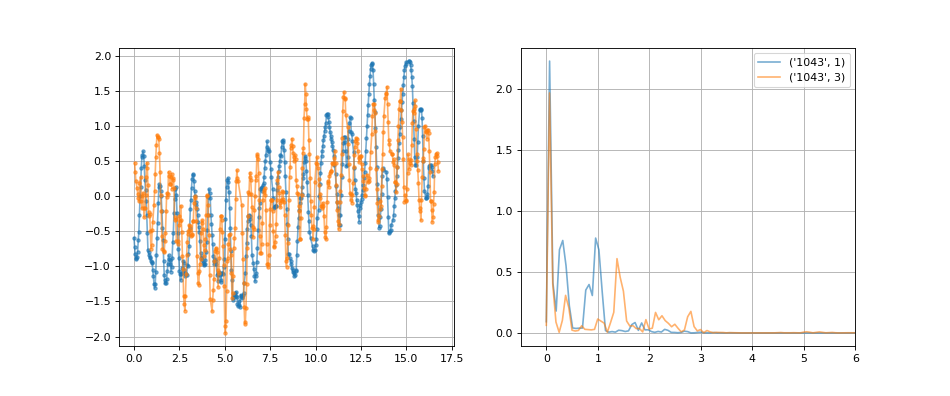

In [24]:
fig, ax = plt.subplots(1,2, figsize=(12,5))
plot_PSD(df,['1043'],'indexR_','RamR',[1,2,3],ax, alpha=0.6) #wrong detections

### No Symptoms right side

In [101]:
#no symptoms right side
no_bradyR=scores.loc[(scores['TaskAbb']=='RamR') & (scores['Bradykinesia - Right']<1) &
          (scores['Tremor - Right']<1) & (scores['Tremor - Left'] < 1)].copy()
no_bradyR['symptom'] = 0
no_bradyR

,SubjID,Visit,TaskAbb,Tremor - Left,Tremor - Right,Bradykinesia - Right,Bradykinesia - Left,symptom
127,1004,2,RamR,0.0,0.0,0.0,NaN,0
142,1004,3,RamR,0.0,0.0,0.0,NaN,0
952,1023,2,RamR,0.0,0.0,0.0,NaN,0
967,1023,3,RamR,0.0,0.0,0.0,NaN,0
1597,1039,3,RamR,0.0,0.0,0.0,NaN,0
1702,1043,3,RamR,0.0,0.0,0.0,NaN,0
1777,1044,1,RamR,0.0,0.0,0.0,NaN,0
1792,1044,2,RamR,0.0,0.0,0.0,NaN,0
1807,1044,3,RamR,0.0,0.0,0.0,NaN,0
2707,1054,2,RamR,0.0,0.0,0.0,NaN,0


frac detection missing: 0.006965174129353234
median confidence pinkyR = 0.721122
fit failed {} pinkyR


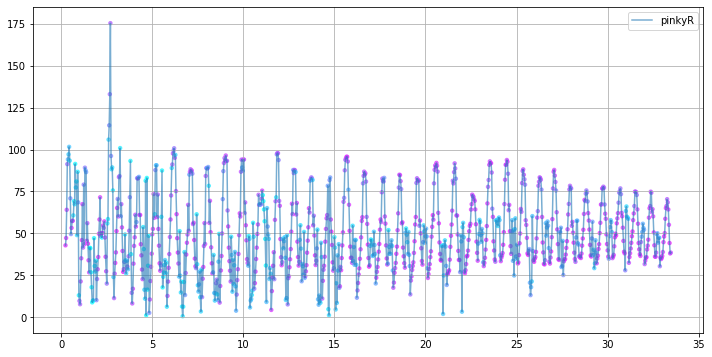

In [279]:
plot_hand_orientation(df, 1004, fingers=['pinkyR'])

frac detection missing: 0.0


<IPython.core.display.Javascript object>


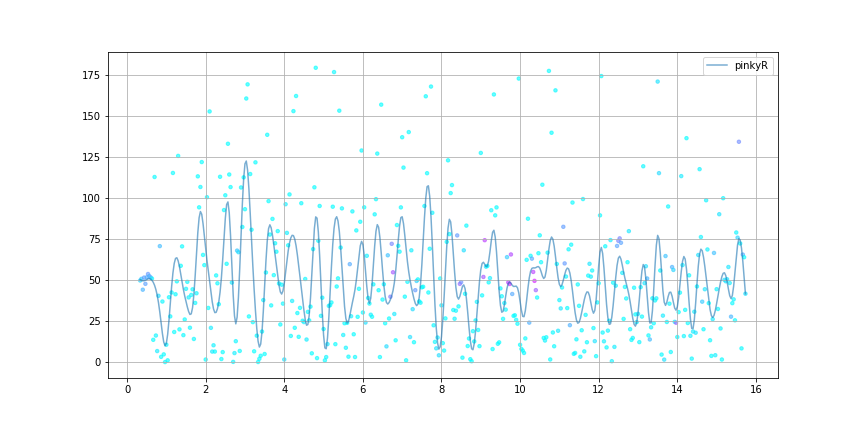

median confidence pinkyR = 0.020749200000000002


In [97]:
plot_hand_orientation(df, 1023, fingers=['pinkyR'])

frac detection missing: 0.0


<IPython.core.display.Javascript object>


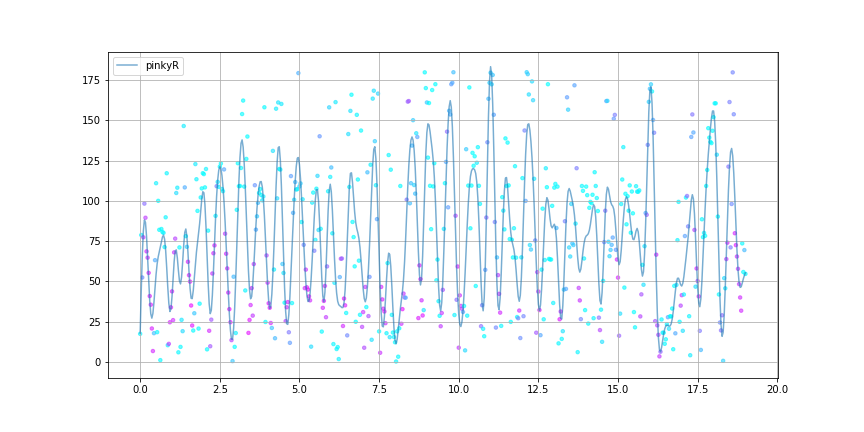

median confidence pinkyR = 0.129101


In [98]:
plot_hand_orientation(df, 1044, fingers=['pinkyR'])

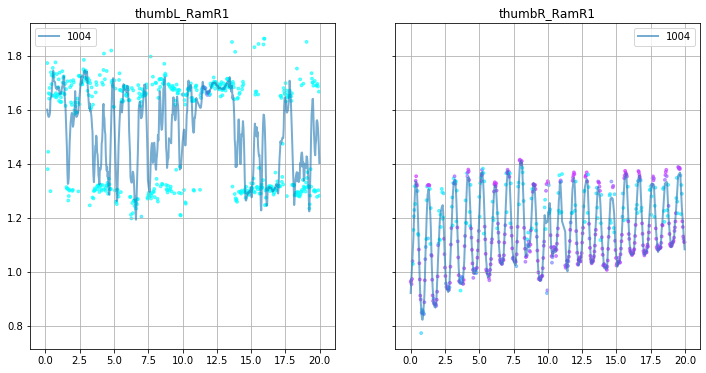

In [126]:
plot_joint_trajectory(df, joint='thumb', task='RamR', cycle=1, subjs=[1004], colormap=True, zscore=False)

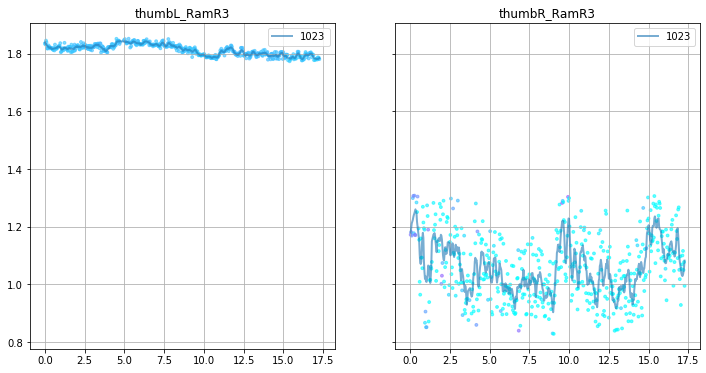

In [127]:
plot_joint_trajectory(df, joint='thumb', task='RamR', cycle=3, subjs=[1023], colormap=True, zscore=False)

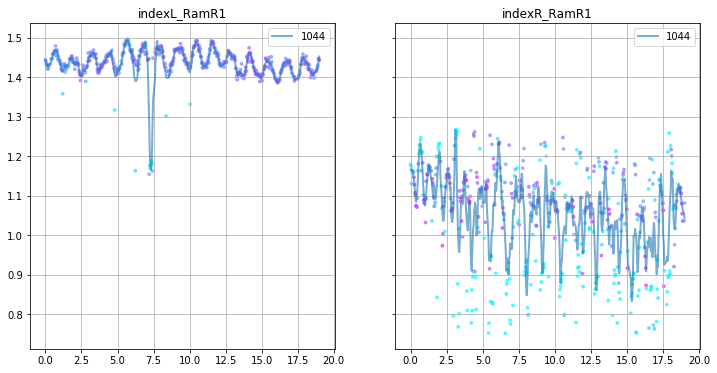

In [281]:
plot_joint_trajectory(df, joint='index', task='RamR', cycle=1, subjs=[1044], colormap=True, zscore=False)

<IPython.core.display.Javascript object>


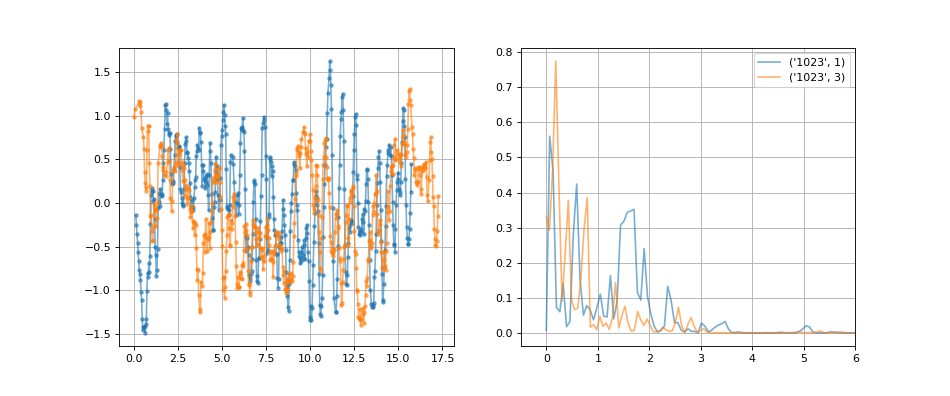

In [25]:
fig, ax = plt.subplots(1,2, figsize=(12,5))
plot_PSD(df,['1023'],'indexR_','RamR',[1,2,3],ax, alpha=0.6) #wrong detections

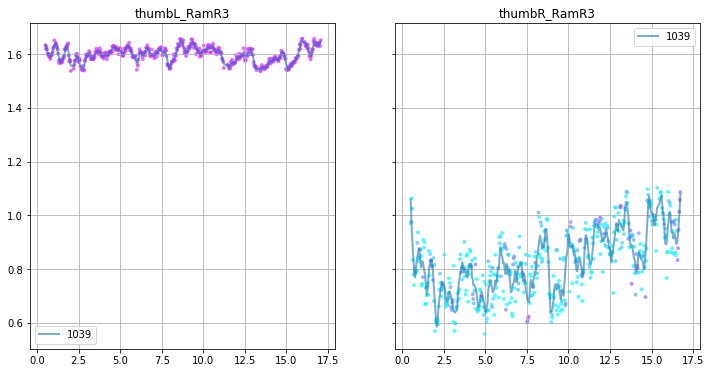

In [128]:
plot_joint_trajectory(df, joint='thumb', task='RamR', cycle=3, subjs=[1039], colormap=True, zscore=False)

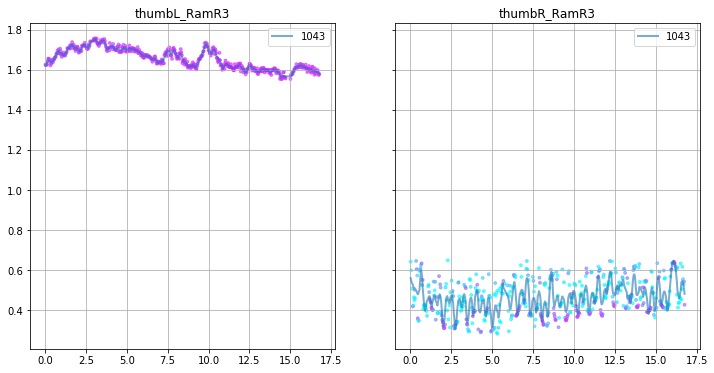

In [129]:
plot_joint_trajectory(df, joint='thumb', task='RamR', cycle=3, subjs=[1043], colormap=True, zscore=False)

In [ ]:
bradyL = scores.loc[(scores['Bradykinesia - Right']>=1) & (scores['TaskAbb']=='FtnR')].copy()
bradyL['symptom'] = 1


## Show distribution of frequencies across all subjects w and w/o Bradykinesia (FtnR)

In [15]:
symptom.rename(columns={'Visit':'cycle', 'TaskAbb':'Task'},inplace=True)

In [16]:
symptom = symptom[['SubjID','cycle','Task','symptom']]

In [17]:
symptom.query('symptom == 1').head(2)

,SubjID,cycle,Task,symptom
109,1004,1,FtnR,1
409,1009,1,FtnR,1


In [18]:
symptom.query('symptom == 0').head(2)

,SubjID,cycle,Task,symptom
124,1004,2,FtnR,0
139,1004,3,FtnR,0


In [19]:
df['frame#'] = df.index
df.head(2)

,SubjID,Task,cycle,elbR_x,elbR_y,elbR_c,wriR_x,wriR_y,wriR_c,elbL_x,...,indexR_y,indexR_c,thumbL_x,thumbL_y,thumbL_c,indexL_x,indexL_y,indexL_c,Npeople,frame#
frame#,,,,,,,,,,,,,,,,,,,,,
0,1004,FtnL,1,329.352,329.357,0.899764,360.768,385.545,0.824514,463.882,...,434.640,0.861225,542.777,236.062,0.155607,545.704,240.565,0.093997,3,0
1,1004,FtnL,1,329.346,328.036,0.889666,360.735,381.679,0.862279,465.103,...,432.987,0.883224,534.912,256.269,0.369207,540.038,254.486,0.064129,3,1


In [20]:
dfwSymptoms = pd.merge(df, symptom, left_on=['SubjID','Task','cycle'], right_on=['SubjID','Task','cycle'])
dfwSymptoms.set_index(dfwSymptoms['frame#'], inplace=True)

In [21]:
dfwSymptoms.head()

,SubjID,Task,cycle,elbR_x,elbR_y,elbR_c,wriR_x,wriR_y,wriR_c,elbL_x,...,indexR_c,thumbL_x,thumbL_y,thumbL_c,indexL_x,indexL_y,indexL_c,Npeople,frame#,symptom
frame#,,,,,,,,,,,,,,,,,,,,,
0,1004,FtnR,1,360.746,208.047,0.856767,412.951,192.374,0.847962,420.722,...,0.199020,0.0,0.0,0.0,0.0,0.0,0.0,3,0,1
1,1004,FtnR,1,360.774,206.735,0.850603,412.951,193.614,0.848872,420.745,...,0.386952,0.0,0.0,0.0,0.0,0.0,0.0,3,1,1
2,1004,FtnR,1,360.784,208.026,0.841101,412.939,193.627,0.846787,420.771,...,0.239356,0.0,0.0,0.0,0.0,0.0,0.0,3,2,1
3,1004,FtnR,1,360.782,210.654,0.858884,412.909,193.647,0.855434,420.773,...,0.115696,0.0,0.0,0.0,0.0,0.0,0.0,3,3,1
4,1004,FtnR,1,360.756,211.962,0.887846,412.886,193.622,0.848815,422.064,...,0.285111,0.0,0.0,0.0,0.0,0.0,0.0,3,4,1


In [22]:
list(dfwSymptoms.SubjID.unique())

[1004, 1009, 1023, 1039, 1043, 1044, 1056]

In [99]:
theta_all

,midR,ringR,pinkyR
frame#,,,
1,112.124684,94.302774,67.638256
2,160.273184,8.303060,19.822027
3,119.179763,11.072480,13.646304
4,50.093703,51.846357,54.099421
5,121.962997,6.874377,4.249679
...,...,...,...
490,60.102932,39.764344,45.920885
491,69.960392,62.166363,57.682980
492,84.832266,74.870404,66.338719


<IPython.core.display.Javascript object>


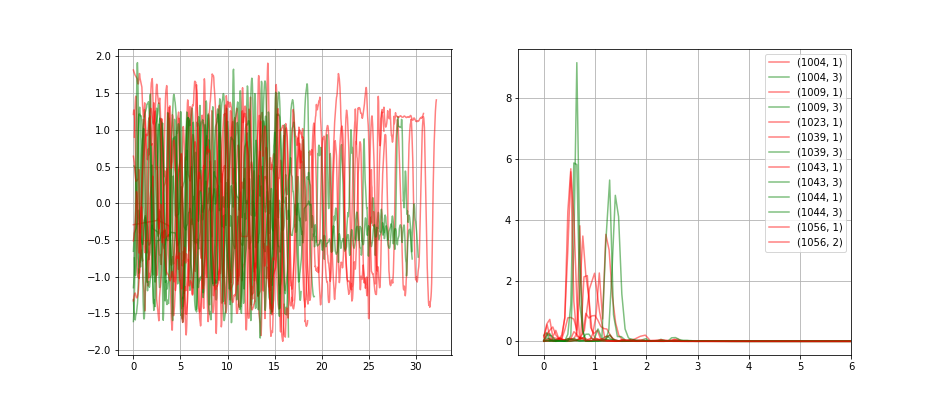

In [23]:
fig, ax = plt.subplots(1,2, figsize=(12,5))
plot_PSD(dfwSymptoms, list(dfwSymptoms.SubjID.unique()), 'wriR_', 'FtnR', dfwSymptoms.cycle.unique(), ax, col=1)

<IPython.core.display.Javascript object>


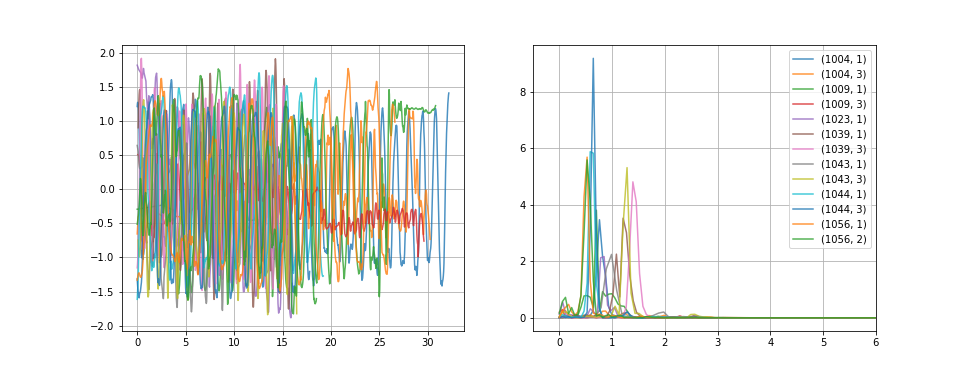

In [24]:
fig, ax = plt.subplots(1,2, figsize=(12,5))
plot_PSD(dfwSymptoms, list(dfwSymptoms.SubjID.unique()), 'wriR_', 'FtnR', dfwSymptoms.cycle.unique(), ax, col=None, alpha=0.8)

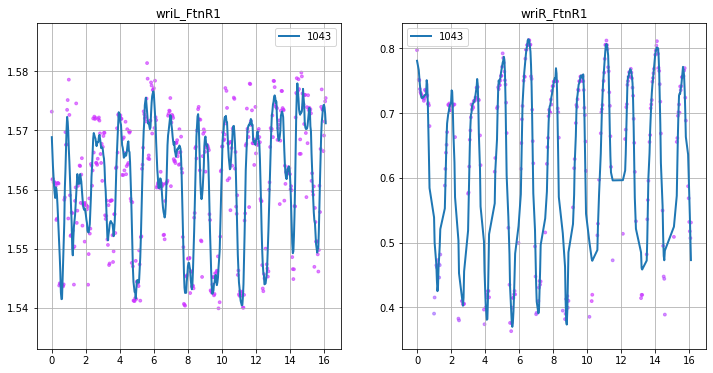

In [42]:
plot_joint_trajectory(df, subjs=[1043], colormap=True)

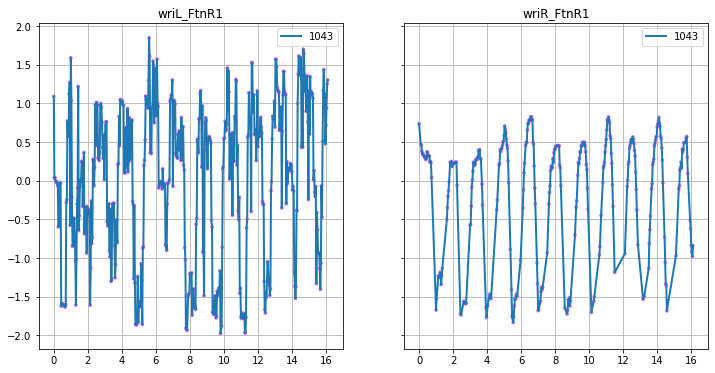

In [87]:
#if interpolating with a cubic spline, a lot of spurious oscillations happen at the terminal points (since the spline)
plot_joint_trajectory(df, subjs=[1043], colormap=True)

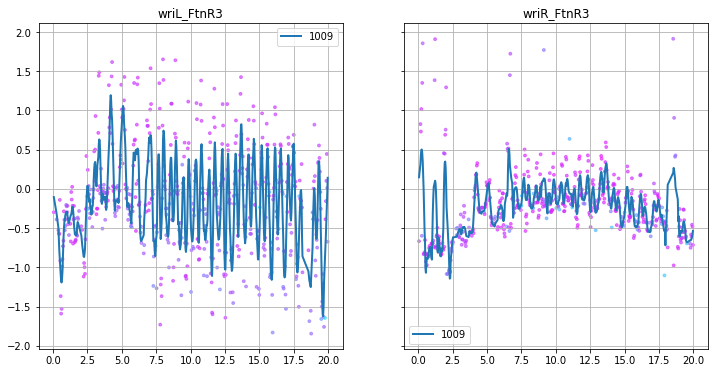

In [79]:
#wrong pose estimation
plot_joint_trajectory(df, joint=['wri'],subjs=[1009], cycle=3, colormap=True, zscore=True) #wrong pose estimation

In [34]:
for s,v in zip(bradyR.SubjID.values, bradyR.Visit):
    plt.figure()
    plt.plot()


1004 1
1009 1
1009 2
1023 1
1023 2
1039 1
1043 1
1043 2
1054 1
1054 2
1056 1
1056 2
1056 3


In [32]:
scores.query('SubjID==1044 & TaskAbb=="FtnR"')

,SubjID,Visit,TaskAbb,Tremor - Left,Tremor - Right,Bradykinesia - Right,Bradykinesia - Left
1774,1044,1,FtnR,0.0,0.0,0.0,NaN
1789,1044,2,FtnR,0.0,0.0,0.0,NaN
1804,1044,3,FtnR,0.0,0.0,0.0,NaN


### features to compute
* dominant frequency position

**Summary Statistics** 
* standard deviation position
* range of speed
* standard deviation of speed
* Sample entropy of speed 



In [160]:
D

,SubjID,Task,cycle,elbR_x,elbR_y,elbR_c,wriR_x,wriR_y,wriR_c,elbL_x,...,indexR_c,thumbL_x,thumbL_y,thumbL_c,indexL_x,indexL_y,indexL_c,Npeople,frame#,symptom
frame#,,,,,,,,,,,,,,,,,,,,,
0,1043,FtnR,3,335.370,370.616,0.802416,382.405,275.104,0.715439,580.548,...,0.654760,546.645,505.449,0.868501,576.372,500.553,0.854624,1,0,0
1,1043,FtnR,3,335.329,366.186,0.757063,392.649,257.524,0.661495,580.540,...,0.784330,546.666,505.401,0.850037,576.735,500.506,0.857432,1,1,0
2,1043,FtnR,3,335.308,357.394,0.832344,395.604,251.587,0.753755,579.157,...,0.736424,546.811,504.968,0.859960,576.817,500.781,0.844990,2,2,0
3,1043,FtnR,3,333.927,351.473,0.791919,399.981,245.761,0.715261,579.141,...,0.726389,546.796,504.627,0.841410,576.287,501.198,0.824910,2,3,0
4,1043,FtnR,3,333.906,347.033,0.871689,401.450,244.306,0.706434,580.515,...,0.652959,546.601,504.158,0.839668,576.215,501.058,0.849026,2,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
490,1043,FtnR,3,339.739,357.402,0.653254,383.829,225.167,0.778163,583.564,...,0.440075,549.590,507.324,0.751605,580.890,501.663,0.744083,2,490,0
491,1043,FtnR,3,339.720,357.380,0.504908,392.661,229.593,0.780435,583.556,...,0.372705,550.048,507.406,0.746613,580.836,501.654,0.739222,2,491,0
492,1043,FtnR,3,342.678,358.839,0.520294,399.980,232.560,0.676657,583.562,...,0.180205,550.047,507.385,0.732053,580.847,501.631,0.739021,2,492,0


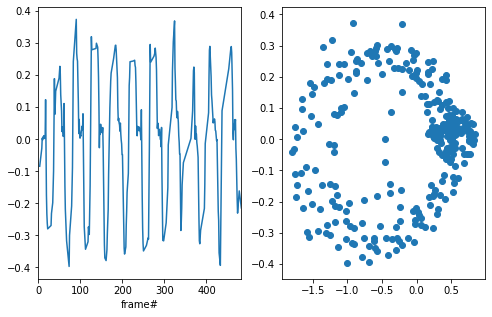

In [173]:
fig, ax = plt.subplots(1,2, figsize=(8,5))
for cycle in [1]:
    D = dfwSymptoms.query('SubjID==1043 & cycle==@cycle & Task=="FtnR"')
    p = dist_from_ref(D,'wriR_')
    p.diff().plot(ax=ax[0])
    ax[1].scatter(p,p.diff())

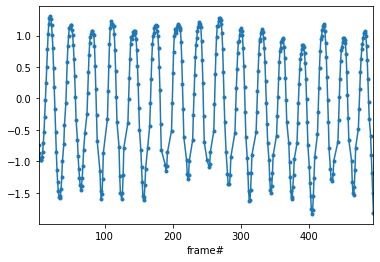

In [155]:
p.plot(style='.-')

count    396.000000
mean      -0.002719
std        0.249127
min       -0.530186
25%       -0.223189
50%        0.013720
75%        0.223548
max        0.537014
dtype: float64


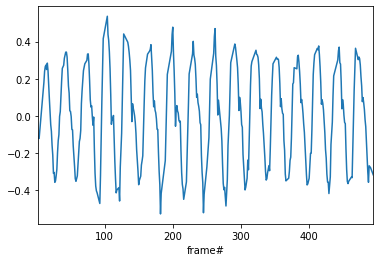

In [156]:
print(p.diff().describe())
p.diff().plot()

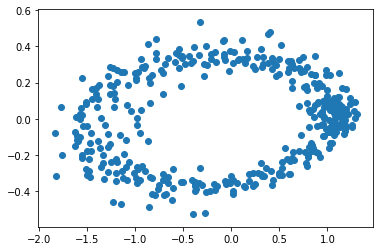

In [157]:
plt.scatter(p,p.diff())

Plot distance from nose

<IPython.core.display.Javascript object>


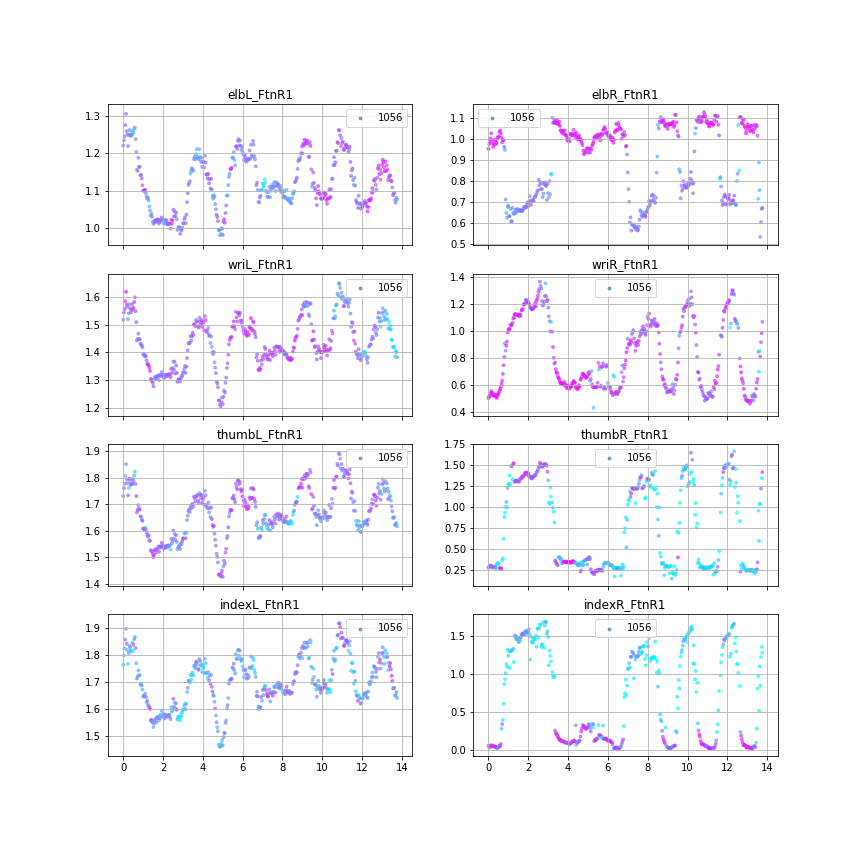

In [29]:
plot_joint_trajectory_norm('FtnR',['1056'], colormap=True)
plt.savefig('../Figs/1056_FtnR1.jpg', dpi=300)

## Ram

<IPython.core.display.Javascript object>


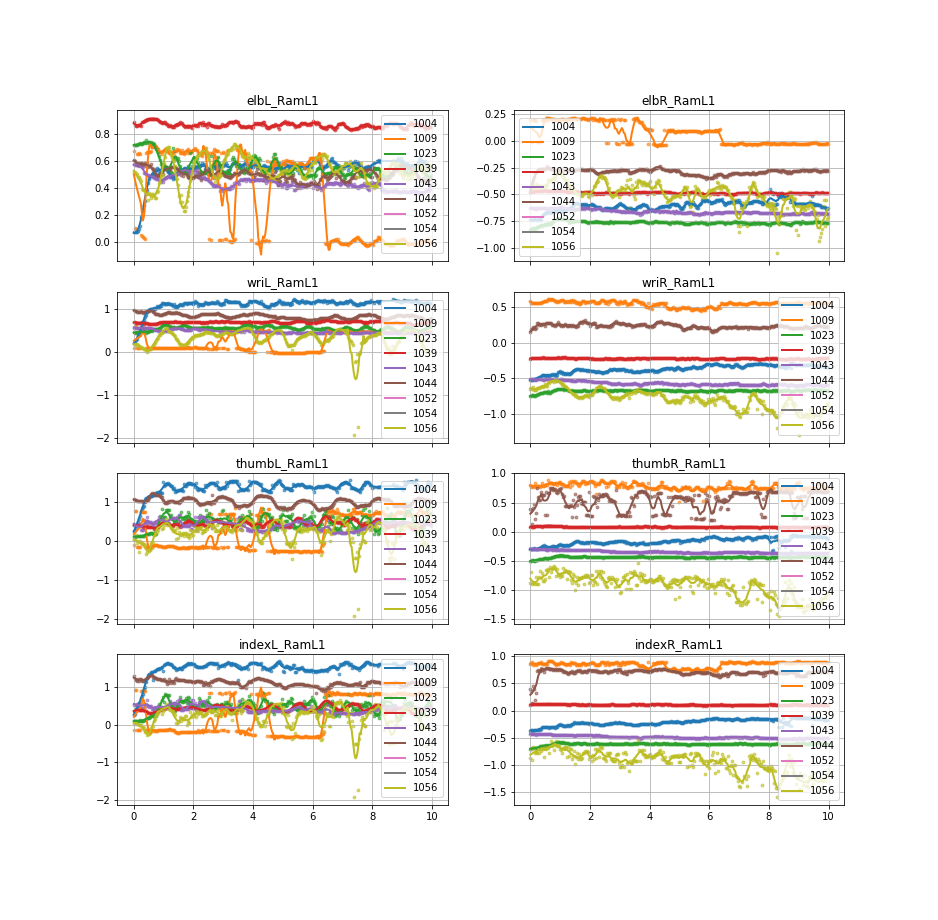

missing  1052 elbL_ 0
missing  1052 elbR_ 0
missing  1052 wriL_ 0
missing  1052 wriR_ 0
missing  1052 thumbL_ 0
missing  1052 thumbR_ 0
missing  1052 indexL_ 0
missing  1052 indexR_ 0
missing  1054 elbL_ 0
missing  1054 elbR_ 0
missing  1054 wriL_ 0
missing  1054 wriR_ 0
missing  1054 thumbL_ 0
missing  1054 thumbR_ 0
missing  1054 indexL_ 0
missing  1054 indexR_ 0


In [31]:
plot_joint_trajectory_norm('RamL')
plt.savefig('../Figs/RamL1_All.jpg', dpi=300)

<IPython.core.display.Javascript object>


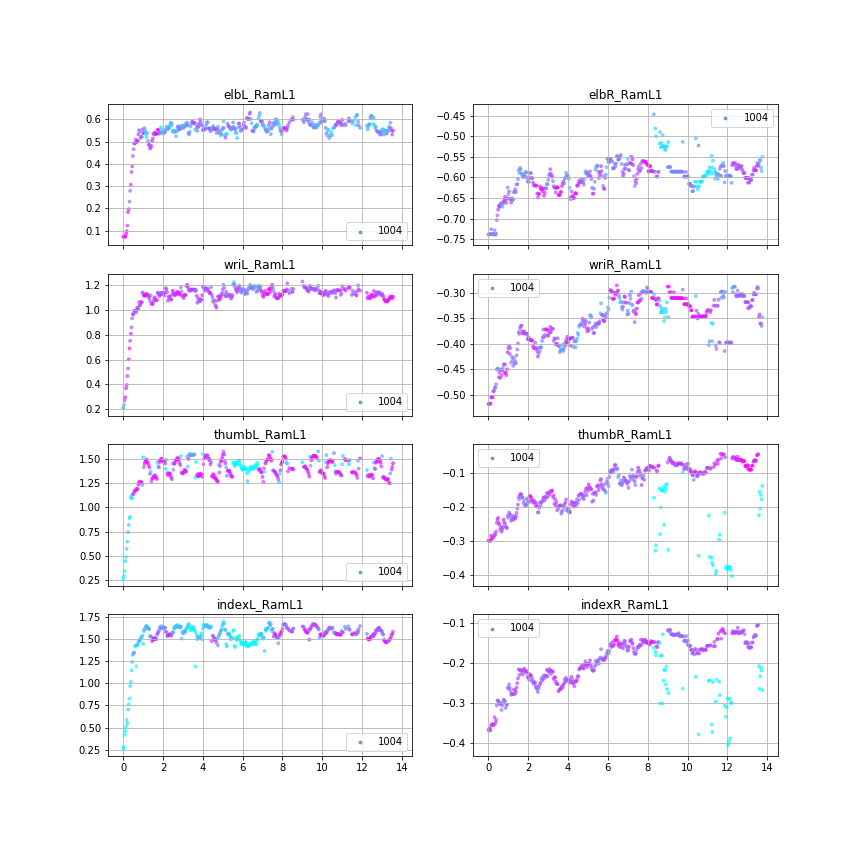

In [31]:
s = '1004'
task = 'RamL'
plot_joint_trajectory_norm(task,[s], colormap=True)
plt.savefig('../Figs/'+s+task+'1.jpg', dpi=300)

In [ ]:
#try different interpolation methods


In [121]:
# dfs = df.query('SubjID==1009 & Task=="FtnR" & cycle==1').copy()
# L = (np.sqrt( (dfs.midHip_x -dfs.neck_x)**2 + (dfs.midHip_y-dfs.neck_y)**2) ) #trunk length (ref length)
# p = (dfs.wriR_x - dfs.nose_x)/L
# z = stats.zscore(p)
# sns.distplot(z, bins=40)

Show only x-coordinates from nose

<IPython.core.display.Javascript object>


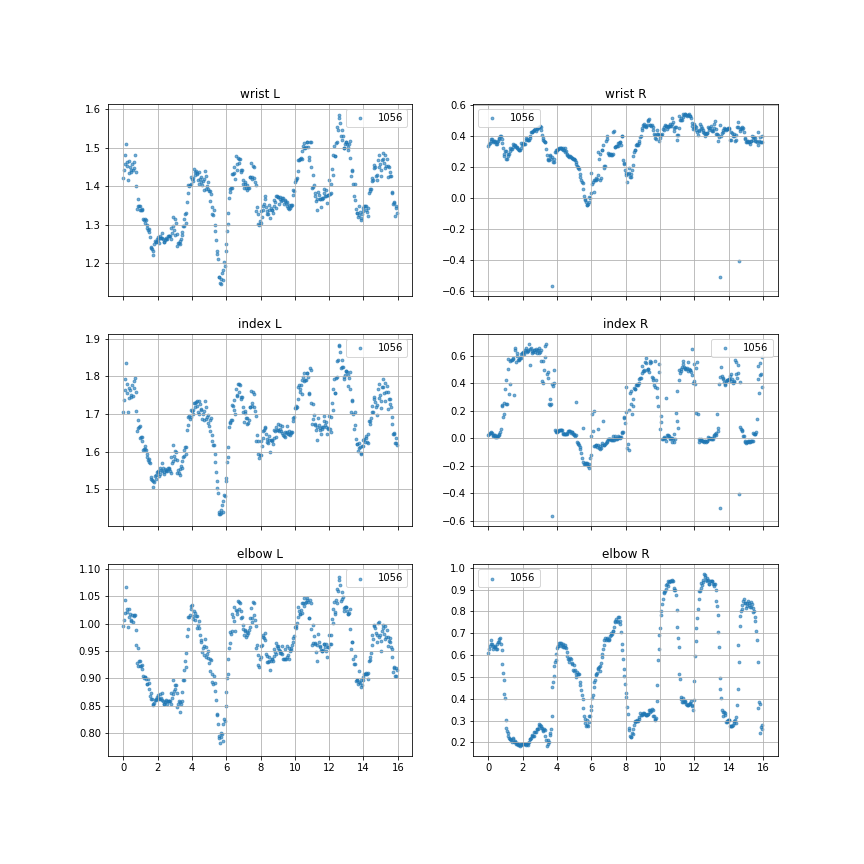

In [126]:
plot_joint_trajectory('FtnR',['1056'])
plt.savefig('../Figs/1056_FtnR1_x.jpg', dpi=300)
# plot_joint_trajectory('FtnR')

This person is moving their head during the task - therefore the left side joints show this change - could be used as a feature to detect motor symptoms?

<IPython.core.display.Javascript object>


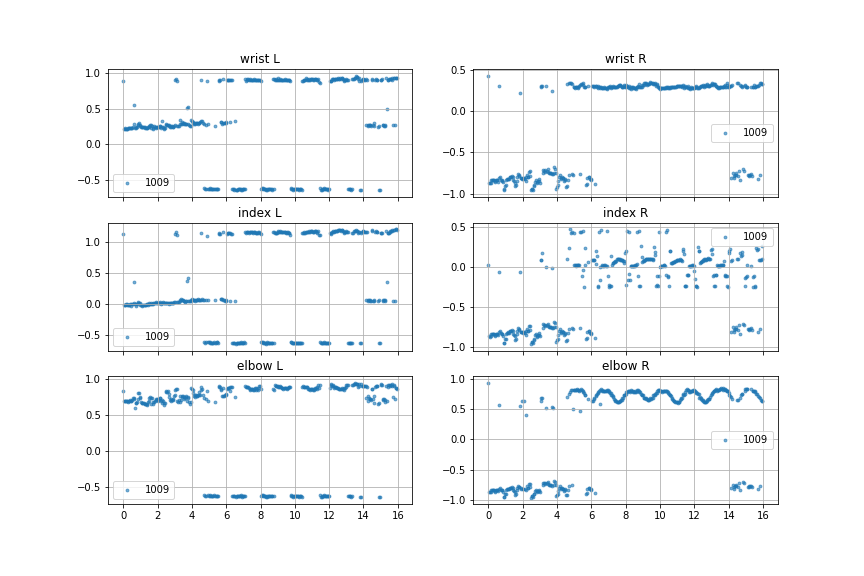

In [95]:
plot_joint_trajectory('FtnR',['1009'])
# plot_joint_trajectory('FtnR')

<IPython.core.display.Javascript object>


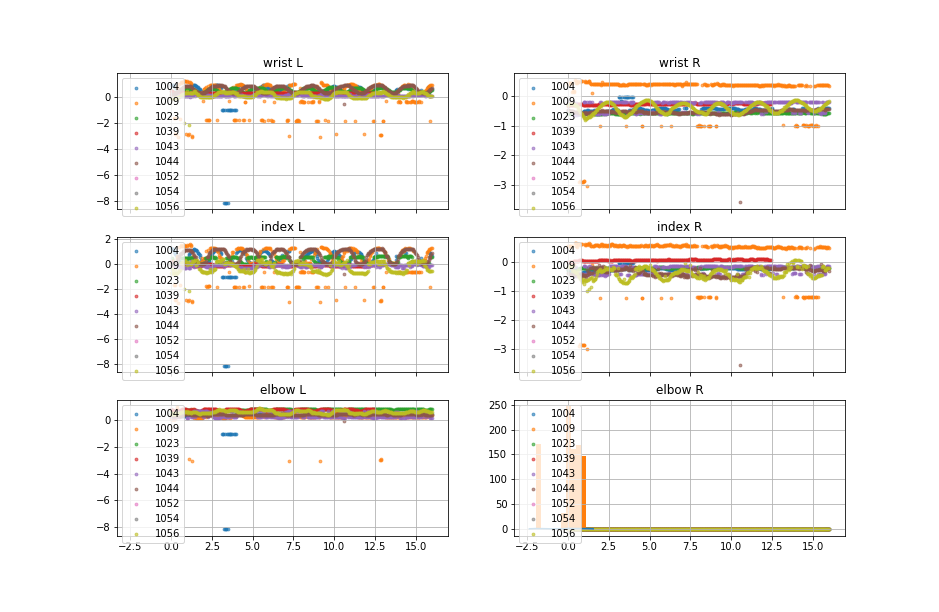

In [39]:
plot_joint_trajectory('FtnL')

## TO DO

### Missed detection problem
* Remove outliers: distribution of deltas (speeds)
* or remove detection with low confidence


<IPython.core.display.Javascript object>


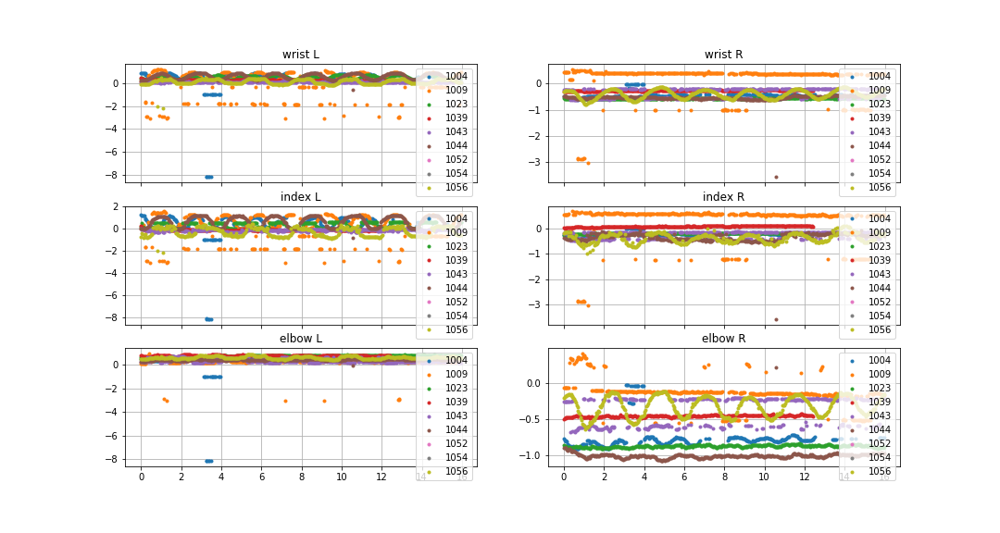

In [135]:
plot_joint_trajectory('FtnL')

<IPython.core.display.Javascript object>


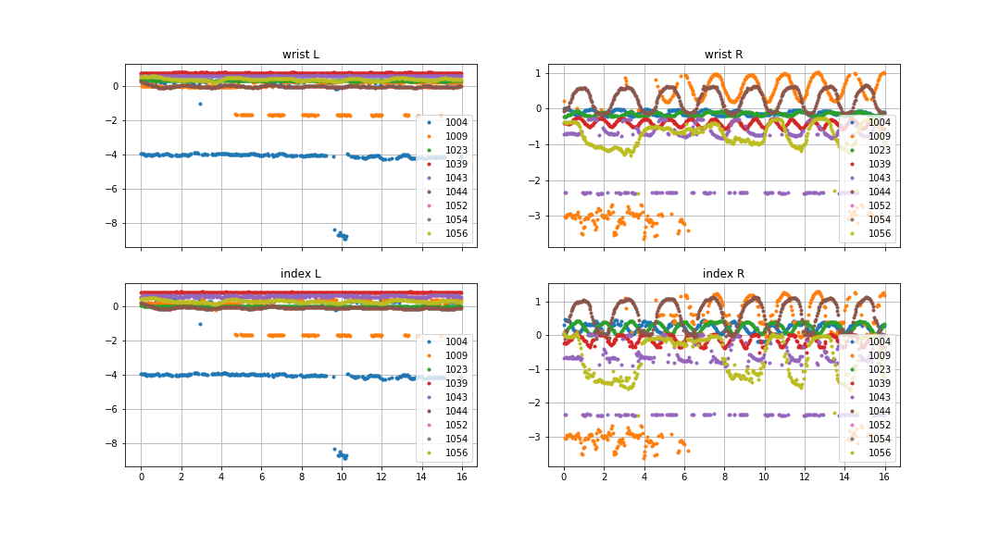

In [97]:
#list of bodyparts to normalize (for later)
bodyparts = list(df.columns)
bodyparts = [b for b in bodyparts if ('R' in b or 'L' in b) and ('_c' not in b)]
T = 400

fig, ax = plt.subplots(2, 2, sharex=True, figsize=(15,8))
for s in df.SubjID.unique():
    
    dfs = df.query('SubjID == @s & Task=="FtnR" & cycle==1').copy()    
    dfs = dfs[:T]

    #normalization factor (hip length)    
    L = (np.sqrt( (dfs.midHip_x -dfs.neck_x)**2 + (dfs.midHip_y-dfs.neck_y)**2) ) #trunk length (ref length)
    t = dfs.index/25
        
    ax[0,0].plot(t[:T], (dfs.wriL_x - dfs.nose_x)/L ,'o', MarkerSize=3); ax[0,0].set_title('wrist L')
    ax[0,1].plot(t[:T], (dfs.wriR_x - dfs.nose_x)/L,'o', MarkerSize=3); ax[0,1].set_title('wrist R')
    ax[1,0].plot(t[:T], (dfs.indexL_x - dfs.nose_x)/L, 'o', MarkerSize=3 ); ax[1,0].set_title('index L')
    ax[1,1].plot(t[:T], (dfs.indexR_x - dfs.nose_x)/L,'o', MarkerSize=3 ); ax[1,1].set_title('index R')
    
ax = ax.ravel()
for i in range(4):
    ax[i].grid()
    ax[i].legend(df.SubjID.unique())

<IPython.core.display.Javascript object>


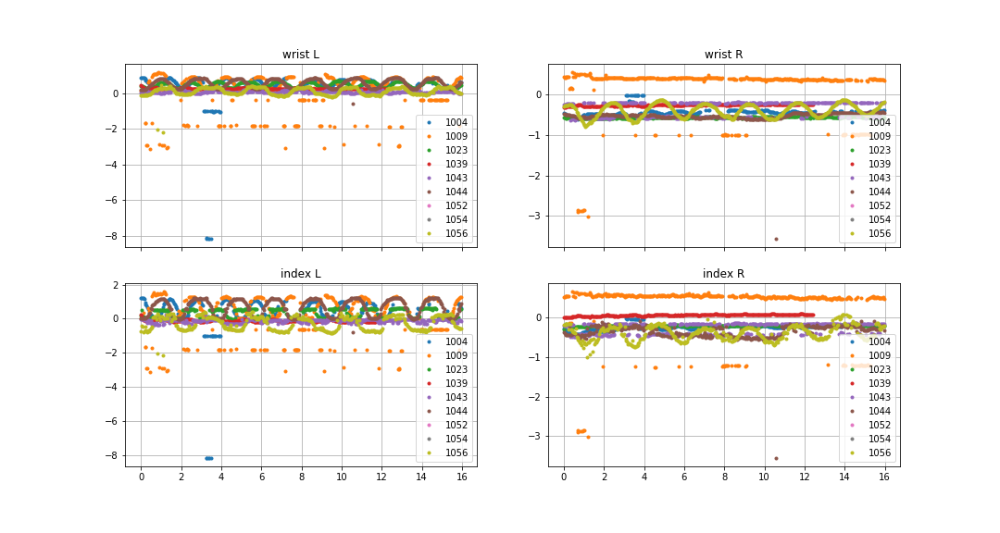

In [99]:
#list of bodyparts to normalize (for later)
bodyparts = list(df.columns)
bodyparts = [b for b in bodyparts if ('R' in b or 'L' in b) and ('_c' not in b)]
T = 400

fig, ax = plt.subplots(2, 2, sharex=True, figsize=(15,8))
for s in df.SubjID.unique():
    
    dfs = df.query('SubjID == @s & Task=="FtnL" & cycle==1').copy()    
    dfs = dfs[:T]

    #normalization factor (hip length)    
    L = (np.sqrt( (dfs.midHip_x -dfs.neck_x)**2 + (dfs.midHip_y-dfs.neck_y)**2) ) #trunk length (ref length)
    t = dfs.index/25
        
    ax[0,0].plot(t[:T], (dfs.wriL_x - dfs.nose_x)/L ,'o', MarkerSize=3); ax[0,0].set_title('wrist L')
    ax[0,1].plot(t[:T], (dfs.wriR_x - dfs.nose_x)/L,'o', MarkerSize=3); ax[0,1].set_title('wrist R')
    ax[1,0].plot(t[:T], (dfs.indexL_x - dfs.nose_x)/L, 'o', MarkerSize=3 ); ax[1,0].set_title('index L')
    ax[1,1].plot(t[:T], (dfs.indexR_x - dfs.nose_x)/L,'o', MarkerSize=3 ); ax[1,1].set_title('index R')
    
ax = ax.ravel()
for i in range(4):
    ax[i].grid()
    ax[i].legend(df.SubjID.unique())

<IPython.core.display.Javascript object>


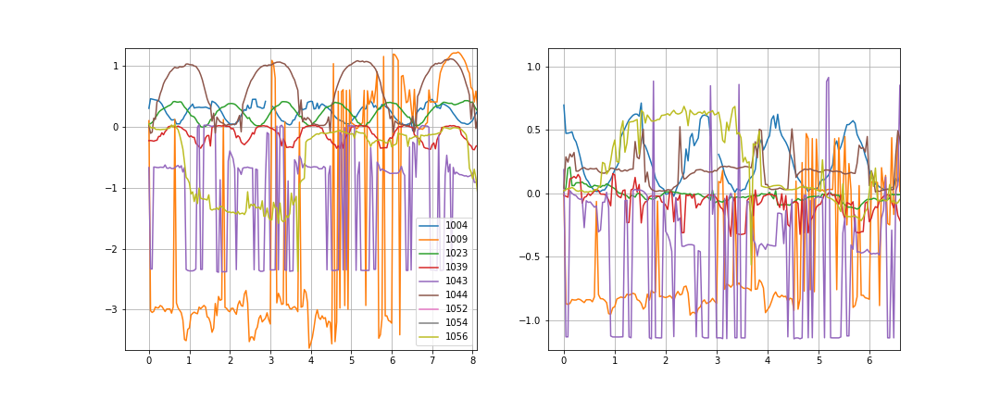

In [53]:
#list of bodyparts to normalize (for later)
bodyparts = list(df.columns)
bodyparts = [b for b in bodyparts if ('R' in b or 'L' in b) and ('_c' not in b)]

fig, (ax1, ax2) = plt.subplots(1, 2, sharey=False, figsize=(15,6))
for s in df.SubjID.unique():
    s = str(s)
    dfs = df.query('SubjID == @s & Task=="FtnR" & cycle==1').copy()    
    L = (np.sqrt( (dfs.midHip_x -dfs.neck_x)**2 + (dfs.midHip_y-dfs.neck_y)**2) ) #trunk length (ref length)
    t = dfs.index/25
    ax1.plot(t, (dfs.indexR_x - dfs.nose_x)/L)
    ax2.plot(t, (dfs.indexR_y - dfs.nose_y)/L)
ax1.grid(); ax2.grid()
ax1.legend(df.SubjID.unique())

## Process single user / task

In [4]:
subj = '1004'
task = 'RamL'
cycle = 1
task = task+'_'+str(cycle)
filepath = datapath / subj
print(filepath)

C:\openpose\output\1004


In [128]:
data_files = os.listdir(filepath)
data_files[:5]

['FtnL_1_000000000000_keypoints.json',
 'FtnL_1_000000000001_keypoints.json',
 'FtnL_1_000000000002_keypoints.json',
 'FtnL_1_000000000003_keypoints.json',
 'FtnL_1_000000000004_keypoints.json']

In [131]:
posefiles = glob.glob((filepath / task).as_posix()+'*')
posefiles = [Path(p) for p in posefiles] 
print(posefiles[0])

C:\openpose\output\1004\RamL_1_000000000000_keypoints.json


In [132]:
with open(posefiles[0]) as f:
    data= json.load(f)

In [133]:
len((data['people'])) # 3 people identified in video frame

2

In [134]:
df = pd.DataFrame()
Npeople = []
for file in posefiles:
    with open(file) as f:
        try:
            data = json.load(f)
        except(UnicodeDecodeError):
            print('cannot parse ',str(file))
            
    Npeople.append(len(data['people']))
    person = 0
    pose = data['people'][person]['pose_keypoints_2d']
    pose_hand_L = data['people'][person]['hand_left_keypoints_2d']
    pose_hand_R = data['people'][person]['hand_right_keypoints_2d']
    d = {'elbR_x':pose[9], 'elbR_y':pose[10], 'elbR_c':pose[11], 'wriR_x':pose[12], 'wriR_y':pose[13], 'wriR_c':pose[14], 
         'elbL_x':pose[18], 'elbL_y':pose[19], 'elbL_c':pose[20], 'wriL_x':pose[21], 'wriL_y':pose[22], 'wriL_c':pose[23],
         'nose_x':pose[0], 'nose_y':pose[1], 'nose_c':pose[2], 
         'thumbR_x':pose_hand_R[12], 'thumbR_y':pose_hand_R[13], 'thumbR_c':pose_hand_R[14],
         'indexR_x':pose_hand_R[24], 'indexR_y':pose_hand_R[25], 'indexR_c':pose_hand_R[26],
         'thumbL_x':pose_hand_L[12], 'thumbL_y':pose_hand_L[13], 'thumbL_C':pose_hand_L[14],
         'indexL_x':pose_hand_L[24], 'indexL_y':pose_hand_L[25], 'indexL_c':pose_hand_L[26],
}
    df = pd.concat((df,pd.DataFrame(d, index=[0])))
    
df.reset_index(drop=True, inplace=True)
t = df.index/25
df.set_index(t, inplace=True)

In [135]:
data['people'][0].keys()

dict_keys(['person_id', 'pose_keypoints_2d', 'face_keypoints_2d', 'hand_left_keypoints_2d', 'hand_right_keypoints_2d', 'pose_keypoints_3d', 'face_keypoints_3d', 'hand_left_keypoints_3d', 'hand_right_keypoints_3d'])

In [136]:
df.head()

,elbR_x,elbR_y,elbR_c,wriR_x,wriR_y,wriR_c,elbL_x,elbL_y,elbL_c,wriL_x,...,thumbR_c,indexR_x,indexR_y,indexR_c,thumbL_x,thumbL_y,thumbL_C,indexL_x,indexL_y,indexL_c
0.00,346.376,214.561,0.855726,369.869,275.858,0.867179,432.471,181.946,0.858018,446.871,...,0.727908,385.696,312.234,0.333271,453.429,239.308,0.010885,452.526,240.888,0.006771
0.04,346.378,214.558,0.857908,369.858,275.828,0.866287,432.472,181.947,0.858410,449.478,...,0.730573,385.969,312.198,0.322596,456.005,240.078,0.010123,454.403,241.451,0.007988
0.08,346.374,214.556,0.858197,369.877,275.844,0.867750,432.500,181.943,0.860964,453.384,...,0.695404,385.996,311.354,0.333940,461.397,246.937,0.017116,469.021,250.524,0.008181
0.12,346.367,214.497,0.859585,369.865,275.831,0.865118,432.488,181.972,0.868896,456.025,...,0.711232,385.500,311.543,0.360925,472.192,250.438,0.072813,473.592,254.871,0.035328
0.16,346.352,213.280,0.852371,369.866,275.832,0.864910,432.558,183.182,0.878340,462.544,...,0.704232,385.516,311.963,0.384546,475.572,248.310,0.017975,477.500,248.310,0.010525


Text(0.5, 1.0, 'wrist y')

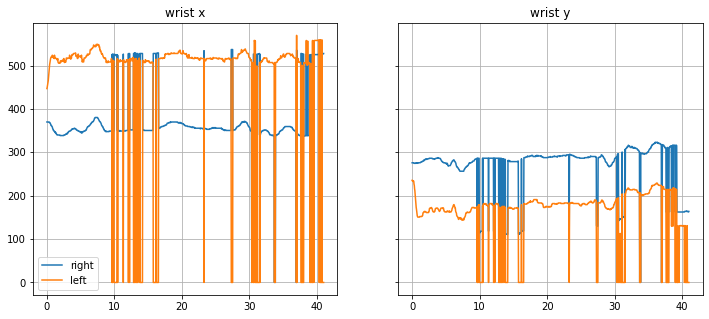

In [141]:
fig, (ax1, ax2) = plt.subplots(1,2, sharey=True, figsize=(12,5))
ax1.plot(df.wriR_x)
ax1.plot(df.wriL_x)
ax1.grid(); ax1.set_title('wrist x'); ax1.legend(['right','left'])
ax2.plot(df.wriR_y)
ax2.plot(df.wriL_y)
ax2.grid(); ax2.set_title('wrist y')

In [151]:
dfcopy = df.copy()
df = df.iloc[:125,:]

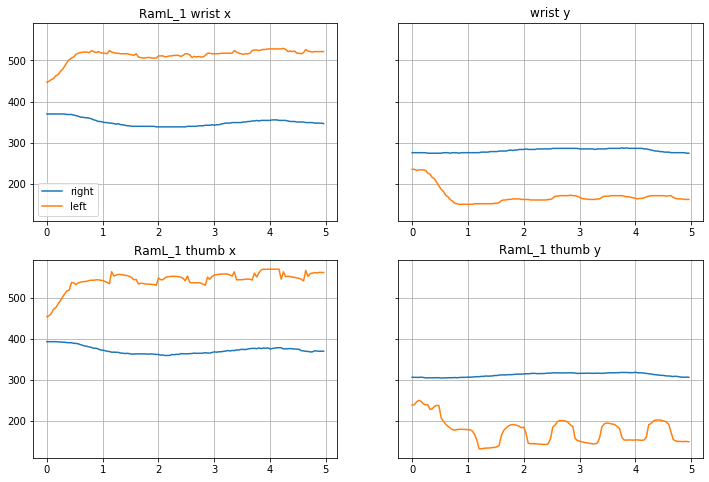

In [152]:
fig, ax = plt.subplots(2,2, sharey=True, figsize=(12,8))
ax1 = ax[0,0]; ax2 = ax[0,1]; ax3=ax[1,0]; ax4 = ax[1,1]
ax1.plot(df.wriR_x)
ax1.plot(df.wriL_x)
ax1.grid(); ax1.set_title(task + ' wrist x'); ax1.legend(['right','left'])
ax2.plot(df.wriR_y)
ax2.plot(df.wriL_y)
ax2.grid(); ax2.set_title('wrist y')
ax3.plot(df.thumbR_x)
ax3.plot(df.thumbL_x)
ax3.grid(); ax3.set_title(task + ' thumb x');
ax4.plot(df.thumbR_y)
ax4.plot(df.thumbL_y)
ax4.grid(); ax4.set_title(task + ' thumb y'); 


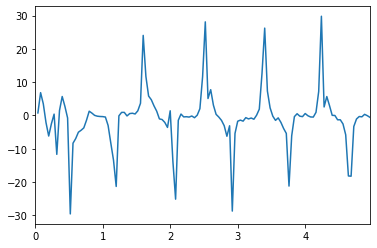

In [162]:
df.thumbL_y.diff().plot()

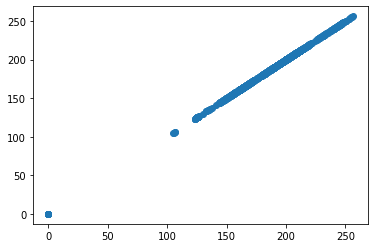

In [150]:
plt.scatter(df.thumbL_y, df.thumbL_y)

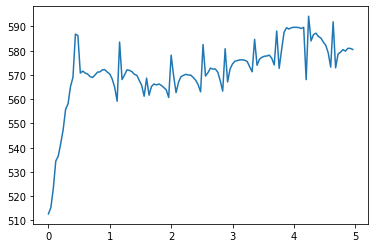

In [160]:
plt.plot(np.sqrt(df.thumbL_x**2 + df.thumbL_y**2))

Text(0.5, 1.0, 'index finger y')

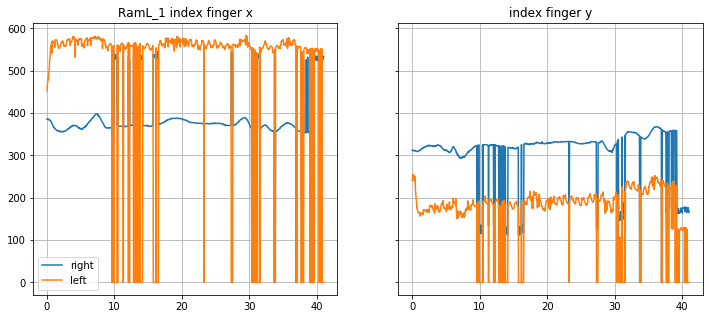

In [138]:
fig, (ax1, ax2) = plt.subplots(1,2, sharey=True, figsize=(12,5))
ax1.plot(df.thumbR_x)
ax1.plot(df.thumbL_x)
ax1.grid(); ax1.set_title(task + ' thumb x'); ax1.legend(['right','left'])
ax2.plot(df.indexR_y)
ax2.plot(df.indexL_y)
ax2.grid(); ax2.set_title('index finger y')

Text(0.5, 1.0, 'relative wrist y')

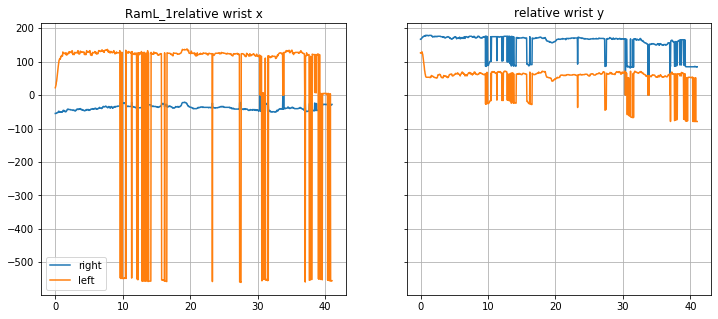

In [139]:
fig, (ax1, ax2) = plt.subplots(1,2, sharey=True, figsize=(12,5))
ax1.plot(df.wriR_x-df.nose_x)
ax1.plot(df.wriL_x-df.nose_x)
ax1.grid(); ax1.set_title(task + 'relative wrist x'); ax1.legend(['right','left'])
ax2.plot(df.wriR_y-df.nose_y)
ax2.plot(df.wriL_y-df.nose_y)
ax2.grid(); ax2.set_title('relative wrist y')

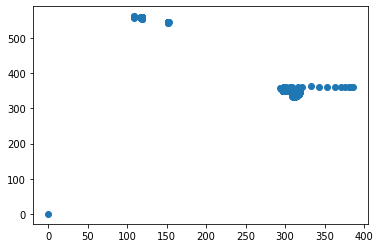

In [123]:
plt.scatter(df.wriR_y, df.wriR_x) #can remove outliers

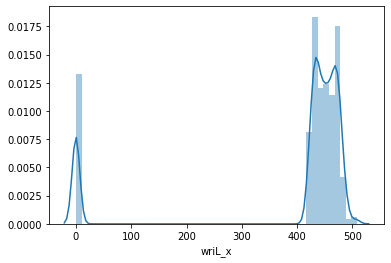

In [126]:
sns.distplot(df.wriL_x)

### Preliminary test

In [222]:
data_files[:4]

['Cycle2_edited_000000000000_keypoints.json',
 'Cycle2_edited_000000000001_keypoints.json',
 'Cycle2_edited_000000000002_keypoints.json',
 'Cycle2_edited_000000000003_keypoints.json']

In [196]:
with open(data_folder / data_files[6]) as f:
    data= json.load(f)

In [197]:
data.keys()

dict_keys(['version', 'people'])

In [198]:
len((data['people'])) # 3 people identified in video frame?

2

In [199]:
data['people'][0].keys()

dict_keys(['person_id', 'pose_keypoints_2d', 'face_keypoints_2d', 'hand_left_keypoints_2d', 'hand_right_keypoints_2d', 'pose_keypoints_3d', 'face_keypoints_3d', 'hand_left_keypoints_3d', 'hand_right_keypoints_3d'])

In [200]:
for i in range(len(data['people'])):
    print(data['people'][i]['person_id'])

[-1]
[-1]


In [213]:
person = 0
pose = data['people'][person]['pose_keypoints_2d']
pose[:10]

[962.991,
 456.662,
 0.858281,
 1007.1,
 539.114,
 0.76923,
 883.451,
 509.65,
 0.747284,
 733.394]

In [214]:
#joint 3 and 4 are right elbow and wrist
joint = 3 #
elb_R_x = pose[3*joint]
elb_R_y = pose[3*joint+1]
joint = 4
wri_R_x = pose[3*joint]
wri_R_y = pose[3*joint+1]
joint = 6
elb_L_x = pose[3*joint]
elb_L_y = pose[3*joint+1]
joint = 7
wri_L_x = pose[3*joint]
wri_L_y = pose[3*joint+1]

(0, 800)

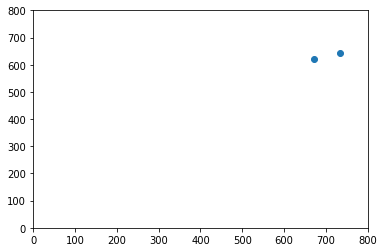

In [215]:
plt.scatter([elb_R_x,wri_R_x],[elb_R_y,wri_R_y])
plt.scatter([elb_L_x,wri_L_x],[elb_L_y,wri_L_y])
plt.xlim([0,800]); plt.ylim([0, 800])

## Process all frames

In [229]:
data_folder / file

WindowsPath('OpenPoseOutput/result.avi')

In [256]:
df = pd.DataFrame()
for file in data_files:
    with open(data_folder / file) as f:
        try:
            data = json.load(f)
        except(UnicodeDecodeError):
            print('cannot parse ',str(file))
    person = 0
    pose = data['people'][person]['pose_keypoints_2d']
    d = {'elbR_x':pose[9], 'elbR_y':pose[10], 'elbR_c':pose[11], 'wriR_x':pose[12], 'wriR_y':pose[13], 'wriR_c':pose[14], 
         'elbL_x':pose[18], 'elbL_y':pose[19], 'elbL_c':pose[20], 'wriL_x':pose[21], 'wriL_y':pose[22], 'wriL_c':pose[23]}
    df = pd.concat((df,pd.DataFrame(d, index=[0])))

cannot parse  result.avi


In [257]:
df.reset_index(drop=True, inplace=True)

In [258]:
t = df.index/25
df.set_index(t, inplace=True)

In [259]:
df.head()

,elbR_x,elbR_y,elbR_c,wriR_x,wriR_y,wriR_c,elbL_x,elbL_y,elbL_c,wriL_x,wriL_y,wriL_c
0.00,700.987,695.037,0.757156,715.604,624.580,0.816592,1195.43,812.790,0.825597,1018.89,895.232,0.692139
0.04,698.030,689.221,0.746408,700.963,630.423,0.776109,1189.72,810.002,0.837186,1012.99,895.231,0.693593
0.08,703.963,680.389,0.602480,692.267,633.310,0.768762,1189.64,809.911,0.845339,1021.69,889.341,0.708843
0.12,721.656,659.765,0.600823,689.162,627.479,0.769042,1189.55,809.961,0.852632,1007.11,898.137,0.695125
0.16,739.206,645.046,0.703967,683.332,627.446,0.748440,1189.52,809.820,0.851107,1015.92,886.518,0.700045


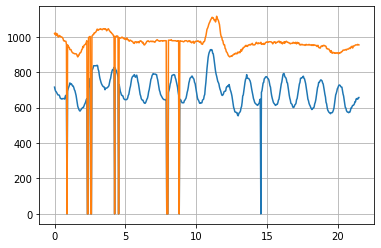

In [268]:
plt.plot(df.wriR_x)
plt.plot(df.wriL_x)
plt.grid()

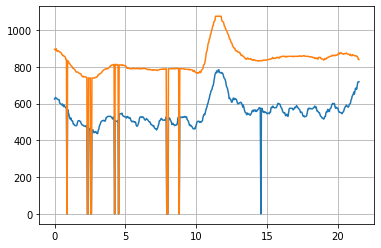

In [273]:
plt.plot(df.wriR_y)
plt.plot(df.wriL_y)
plt.grid()

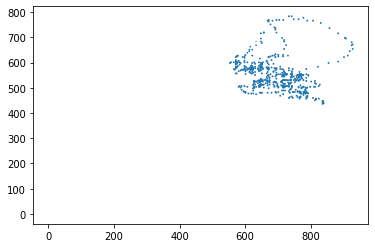

In [265]:
plt.scatter(df.wriR_x, df.wriR_y, df.wriR_c)
# plt.scatter(df.elbR_x, df.elbR_y, df.elbR_c)

(0, 800)

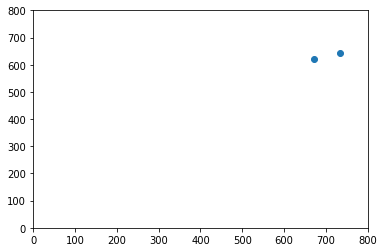

In [203]:
plt.scatter([elb_x,wri_x],[elb_y,wri_y])
plt.xlim([0,800]); plt.ylim([0, 800])

In [163]:
person = 0
hand_r = data['people'][person]['hand_right_keypoints_2d']
hand_l = data['people'][person]['hand_left_keypoints_2d']

In [164]:
print(len(hand_r), len(hand_l))

63 63


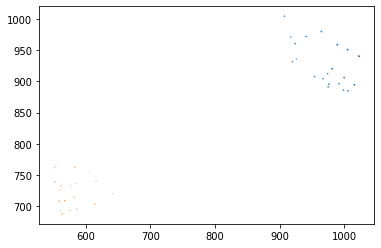

In [166]:
plt.scatter(hand_l[1::3], hand_l[0::3], hand_l[2::3])
plt.scatter(hand_r[1::3], hand_r[0::3], hand_r[2::3])

In [167]:
person = 0
pose = data['people'][person]['pose_keypoints_2d']

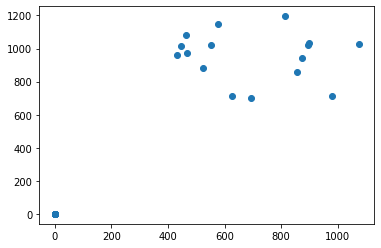

In [169]:
plt.plot(pose[1::3], pose[0::3],'o')


In [41]:
data['people'][1]

{'person_id': [-1],
 'pose_keypoints_2d': [341.974,
  586.155,
  0.85139,
  0,
  0,
  0,
  121.172,
  868.745,
  0.169763,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  356.621,
  521.438,
  0.756104,
  0,
  0,
  0,
  268.268,
  462.658,
  0.816105,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0],
 'face_keypoints_2d': [],
 'hand_left_keypoints_2d': [0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0],
 'hand_right_keypoints_2d': [0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0

## Misc

In [94]:
#renaming files 
import shutil

task = 'RamR'
path = 'c:/openpose/output/1054/'
files = glob.glob(path+'Cycle3_'+task+'*')
files = [Path(f) for f in files]
for f in files:
    dest_ = f.as_posix().split('_')[1:]
    dest_.insert(1,'_2_')
    dest_ = ''.join(dest_)
    destination = Path('c:/openpose/output/1054/new/' / Path(dest_))
    dst = shutil.copyfile(f, destination)



In [218]:
path = 'c:/openpose/output/1054/'
files = os.listdir(path)
for f in files:
    ind = f.find('keypoints')
    newfile = f[:ind]+'_'+f[ind:]
    destination = Path('c:/openpose/output/1054_new/'+newfile)
    dst = shutil.copyfile(Path(path+f), destination)
    print(Path(path+f), destination)


c:\openpose\output\1054\RamL_2_000000000000keypoints.json c:\openpose\output\1054_new\RamL_2_000000000000_keypoints.json
c:\openpose\output\1054\RamL_2_000000000001keypoints.json c:\openpose\output\1054_new\RamL_2_000000000001_keypoints.json
c:\openpose\output\1054\RamL_2_000000000002keypoints.json c:\openpose\output\1054_new\RamL_2_000000000002_keypoints.json
c:\openpose\output\1054\RamL_2_000000000003keypoints.json c:\openpose\output\1054_new\RamL_2_000000000003_keypoints.json
c:\openpose\output\1054\RamL_2_000000000004keypoints.json c:\openpose\output\1054_new\RamL_2_000000000004_keypoints.json
c:\openpose\output\1054\RamL_2_000000000005keypoints.json c:\openpose\output\1054_new\RamL_2_000000000005_keypoints.json
c:\openpose\output\1054\RamL_2_000000000006keypoints.json c:\openpose\output\1054_new\RamL_2_000000000006_keypoints.json
c:\openpose\output\1054\RamL_2_000000000007keypoints.json c:\openpose\output\1054_new\RamL_2_000000000007_keypoints.json
c:\openpose\output\1054\RamL_2_0

In [215]:
files[1]

'RamL_2_000000000000keypoints.json'

In [182]:
str2 = files[0]
str2[str2.find('keypoints')]

'k'

In [187]:
str2[:19]+'_'+str2[19:]

'FtnL_2_000000000000_keypoints.json'

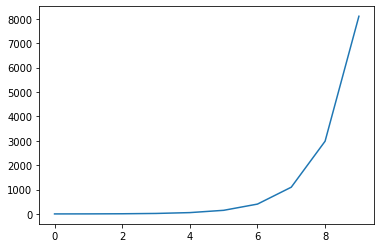

In [2]:
x = np.arange(10)
y = np.exp(x)
plt.plot(x,y)